# GCC JODI OIL 

In [ ]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px

In [ ]:
## Load in the gcc-jodi-oil
datafile = "gcc-jodi-oil.csv"
data=pd.read_csv(datafile, sep=';')
data.head()

,TIME_PERIOD,AREA,ENERGY_PRODUCT_NAME,FLOW_BREAKDOWN,UNIT_MEASURE,OBS_VALUE,ASSESSMENT_CODE,month
0,2006-03,Saudi Arabia,Motor and aviation gasoline,Closing stocks,KBD,x,1,3
1,2006-03,Saudi Arabia,Motor and aviation gasoline,IProducts transferred,CONVBBL,NaN,3,3
2,2006-03,Saudi Arabia,Motor and aviation gasoline,Products transferred,KBD,NaN,3,3
3,2006-03,Saudi Arabia,Motor and aviation gasoline,Products transferred,KTONS,NaN,3,3
4,2006-03,Saudi Arabia,Motor and aviation gasoline,Receipts,KBBL,NaN,3,3


In [ ]:
data.shape

(955500, 8)

In [ ]:
data.dtypes

TIME_PERIOD            object
AREA                   object
ENERGY_PRODUCT_NAME    object
FLOW_BREAKDOWN         object
UNIT_MEASURE           object
OBS_VALUE              object
ASSESSMENT_CODE         int64
month                   int64
dtype: object

In [ ]:
data.head()

,TIME_PERIOD,AREA,ENERGY_PRODUCT_NAME,FLOW_BREAKDOWN,UNIT_MEASURE,OBS_VALUE,ASSESSMENT_CODE,month
0,2006-03,Saudi Arabia,Motor and aviation gasoline,Closing stocks,KBD,x,1,3
1,2006-03,Saudi Arabia,Motor and aviation gasoline,IProducts transferred,CONVBBL,NaN,3,3
2,2006-03,Saudi Arabia,Motor and aviation gasoline,Products transferred,KBD,NaN,3,3
3,2006-03,Saudi Arabia,Motor and aviation gasoline,Products transferred,KTONS,NaN,3,3
4,2006-03,Saudi Arabia,Motor and aviation gasoline,Receipts,KBBL,NaN,3,3


In [ ]:
data.dtypes

TIME_PERIOD            object
AREA                   object
ENERGY_PRODUCT_NAME    object
FLOW_BREAKDOWN         object
UNIT_MEASURE           object
OBS_VALUE              object
ASSESSMENT_CODE         int64
month                   int64
dtype: object

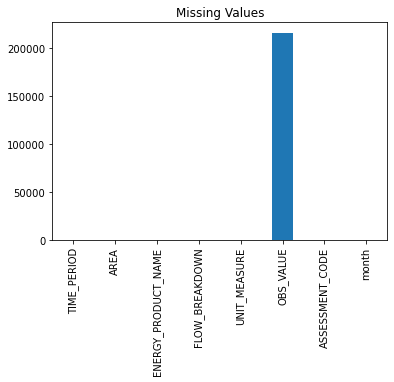

In [ ]:
data.isnull().sum().plot(kind="bar", title="Missing Values");

In [ ]:
data.isna().sum()

TIME_PERIOD                 0
AREA                        0
ENERGY_PRODUCT_NAME         0
FLOW_BREAKDOWN              0
UNIT_MEASURE                0
OBS_VALUE              215712
ASSESSMENT_CODE             0
month                       0
dtype: int64

In [ ]:
df=data.copy()

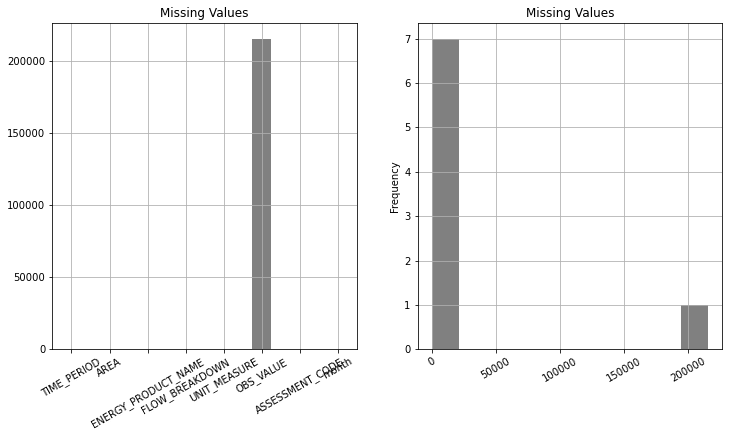

In [ ]:
plt.figure(figsize=(12,6))

 


plt.subplot(121)
df.isnull().sum().plot(kind="bar", title="Missing Values" , color='gray');
plt.grid()
plt.xticks(rotation=30)
plt.subplot(122)
df.isnull().sum().plot(kind="hist", title="Missing Values" , color='gray');
plt.grid()
plt.xticks(rotation=30)

 

plt.show()

In [ ]:
df = df.drop('month', axis=1)

In [ ]:
#replace x with 0 
df['OBS_VALUE']=df['OBS_VALUE'].replace(to_replace='x', value=0, regex=True)

In [ ]:
#convert to float 
df['OBS_VALUE'] = df['OBS_VALUE'].astype('float').round(4)

In [ ]:
df.describe()

,OBS_VALUE,ASSESSMENT_CODE
count,739788.000000,955500.000000
mean,2580.405728,2.965250
std,11484.355351,0.253978
min,-49188.857000,1.000000
25%,0.000000,3.000000
50%,0.000000,3.000000
75%,1045.046075,3.000000
max,360210.000000,3.000000


In [ ]:
#delet all 0 & null Value
#df = df.fillna(0)
df=df.dropna()
df=df[df['OBS_VALUE'] != 0]

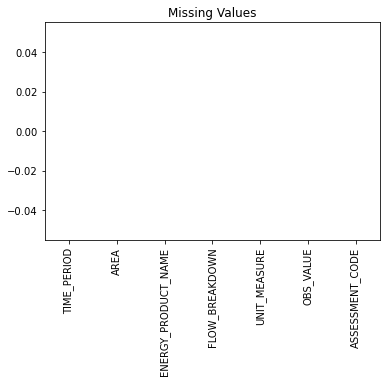

In [ ]:
df.isnull().sum().plot(kind="bar", title="Missing Values");

In [ ]:
df.shape

(324298, 7)

In [ ]:
df['year']= pd.to_datetime(df['TIME_PERIOD'])
df['year']=df['year'].dt.strftime('%Y')
df['year']= df['year'].astype(int)

In [ ]:
#We have deleted the data for the year 2022
#because the year has not ended yet, meaning that the data for this year is not complete 
df=df[(df['year'] != 2022 )]

In [ ]:
df

,TIME_PERIOD,AREA,ENERGY_PRODUCT_NAME,FLOW_BREAKDOWN,UNIT_MEASURE,OBS_VALUE,ASSESSMENT_CODE,year
8,2006-03,Saudi Arabia,Motor and aviation gasoline,Demand,KTONS,1130.5882,3,2006
9,2006-03,Saudi Arabia,Motor and aviation gasoline,Imports,CONVBBL,8500.0000,3,2006
10,2006-04,Saudi Arabia,Motor and aviation gasoline,Closing stocks,CONVBBL,8500.0000,3,2006
11,2006-04,Saudi Arabia,Motor and aviation gasoline,Closing stocks,KBBL,11901.0000,1,2006
12,2006-04,Saudi Arabia,Motor and aviation gasoline,Closing stocks,KTONS,1400.1176,1,2006
...,...,...,...,...,...,...,...,...
955471,2021-04,Bahrain,Total,Exports,KTONS,624.0000,3,2021
955480,2021-05,Bahrain,Total,Exports,KTONS,614.0000,3,2021
955482,2021-06,Bahrain,Total,Closing stocks,KTONS,112.0000,3,2021
955490,2021-06,Bahrain,Total,Exports,KTONS,618.0000,3,2021


# Function 

In [ ]:
#delete outlire 

def delete_outlire(df):
    Q1 = df['OBS_VALUE'].quantile(0.25)
    Q3 =  df['OBS_VALUE'].quantile(0.75)
    IQR = Q3 - Q1    #IQR is interquartile range. 

    filter = ( df['OBS_VALUE'] >= Q1 - 1.5 * IQR) & ( df['OBS_VALUE'] <= Q3 + 1.5 *IQR)
    df=df.loc[filter]
    return df

In [ ]:
# CONVERT ALL UNIT INTO ONE UNIT
def kbd(x):
    if x.UNIT_MEASURE == 'KBBL':
        x.OBS_VALUE = x.OBS_VALUE * 24
    elif x.UNIT_MEASURE == 'KTONS':
        x.OBS_VALUE = (x.OBS_VALUE /58.03)*24
    elif x.UNIT_MEASURE == 'KL':
        x.OBS_VALUE = x.OBS_VALUE *6.29
        
    return x.OBS_VALUE 

#df['OBS_VALUE'] = df[['UNIT_MEASURE','OBS_VALUE']].apply(kbd, axis=1)

In [ ]:
#FILTERS BY COUNTRY 
def Filters_By_Country(df , i ):
    contry=df.copy()
    contry["TIME_PERIOD"] =  pd.to_datetime(contry["TIME_PERIOD"], format="%Y-%m")
    
    contry = contry[contry['AREA']==i]
    contry=contry[(contry['UNIT_MEASURE']=='KBD')]
    contry=contry[(contry['FLOW_BREAKDOWN']=='Imports' )|
               (contry['FLOW_BREAKDOWN']=='Demand')|
               (contry['FLOW_BREAKDOWN']=='Exports')]
    contry=contry[(contry['ENERGY_PRODUCT_NAME']=='Motor and aviation gasoline' )|
               (contry['ENERGY_PRODUCT_NAME']=='Fuel Oil')|
               (contry['ENERGY_PRODUCT_NAME']=='Crude Oil')|
               (contry['ENERGY_PRODUCT_NAME']=='Gas/diesel oil' )|
               (contry['ENERGY_PRODUCT_NAME']=='Kerosenes')|
               (contry['ENERGY_PRODUCT_NAME']=='Liquefied petroleum gases')]
    return contry



In [ ]:
#FILTERS BY FLOW BREAKDOWN
#AND CONVERT YEAR TO datetime TYPE
def SUBSET_FLOW_BREAKDOWN(df):

    groups = df.groupby(['year','FLOW_BREAKDOWN']
                       )["OBS_VALUE"].sum().reset_index(name='total')
    groups = pd.DataFrame(groups)
    return groups

In [ ]:
#FILTERS BY ENERGY PRODUCT
#AND MAKE NEW COLUMN TO SUM OBS_VALUE BY ENERGY_PRODUCT_NAME
def SUBSET_ENERGY_PRODUCT_NAME(df):
    df_out = df.groupby(['year', 'ENERGY_PRODUCT_NAME']
                       )["OBS_VALUE"].sum().reset_index(name='total')
    return df_out


In [ ]:
#MAKE COPY OF DATA AND SAVE IT AS CSV

#df.to_csv('GCC_OIL.csv')

# EDA

# KSA Imports ,Exports And Demand 

By UNIT MEASURE KBD

In [ ]:
KSA = Filters_By_Country(df ,'Saudi Arabia')

In [ ]:
#KSA["TIME_PERIOD"] =  pd.to_datetime(KSA["TIME_PERIOD"], format="%Y-%m")

In [ ]:
KSA.dtypes

TIME_PERIOD            datetime64[ns]
AREA                           object
ENERGY_PRODUCT_NAME            object
FLOW_BREAKDOWN                 object
UNIT_MEASURE                   object
OBS_VALUE                     float64
ASSESSMENT_CODE                 int64
year                            int64
dtype: object

In [ ]:
KSA

,TIME_PERIOD,AREA,ENERGY_PRODUCT_NAME,FLOW_BREAKDOWN,UNIT_MEASURE,OBS_VALUE,ASSESSMENT_CODE,year
24,2006-04-01,Saudi Arabia,Motor and aviation gasoline,Imports,KBD,43.0,3,2006
40,2006-06-01,Saudi Arabia,Motor and aviation gasoline,Demand,KBD,321.0,3,2006
67,2006-08-01,Saudi Arabia,Motor and aviation gasoline,Imports,KBD,121.0,3,2006
79,2006-09-01,Saudi Arabia,Motor and aviation gasoline,Demand,KBD,327.0,3,2006
91,2006-10-01,Saudi Arabia,Motor and aviation gasoline,Demand,KBD,326.0,3,2006
...,...,...,...,...,...,...,...,...
948954,2020-12-01,Saudi Arabia,Fuel Oil,Imports,KBD,251.0,3,2020
948976,2021-02-01,Saudi Arabia,Fuel Oil,Imports,KBD,119.0,3,2021
948984,2021-03-01,Saudi Arabia,Fuel Oil,Exports,KBD,117.0,3,2021
949007,2021-06-01,Saudi Arabia,Fuel Oil,Exports,KBD,169.0,3,2021


In [ ]:
SUBSET_FLOW_BREAKDOWN(KSA)

,year,FLOW_BREAKDOWN,total
0,2002,Demand,11650.0
1,2002,Exports,69343.0
2,2002,Imports,474.0
3,2003,Demand,12630.0
4,2003,Exports,84748.0
5,2003,Imports,344.0
6,2004,Demand,13104.0
7,2004,Exports,88763.0
8,2004,Imports,603.0
9,2005,Demand,13481.0


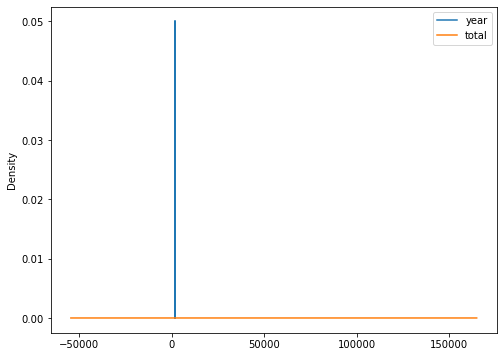

In [ ]:
#1
fig, ax = plt.subplots(figsize=(8,6))
bp =SUBSET_FLOW_BREAKDOWN(KSA).plot(kind='kde', ax=plt.gca())
plt.show()

In [ ]:
#3
#qq = px.data.gapminder().query("continent=='Oceania'")
fig = px.line(SUBSET_FLOW_BREAKDOWN(KSA), x="year", y="total", color='FLOW_BREAKDOWN')
fig.show()

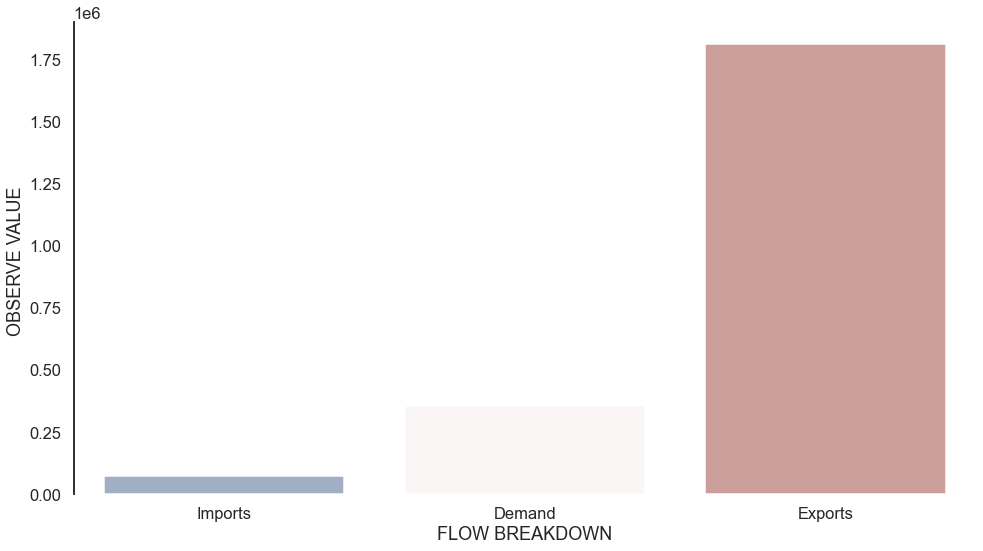

In [ ]:
#4
#  imports ,exports and demand 

groups1=Filters_By_Country(df ,'Saudi Arabia').groupby(['FLOW_BREAKDOWN'])["OBS_VALUE"].sum().reset_index(name='size')


plt.figure(figsize=(14,8))
sharex=True
sns.set_theme(style="white", context="talk")
sns.barplot(x='FLOW_BREAKDOWN', y='size', palette="vlag", data=groups1.sort_values(by='size'))
sns.despine(bottom=True)
plt.xlabel('FLOW BREAKDOWN')
plt.ylabel("OBSERVE VALUE ")
plt.tight_layout(h_pad=2 )

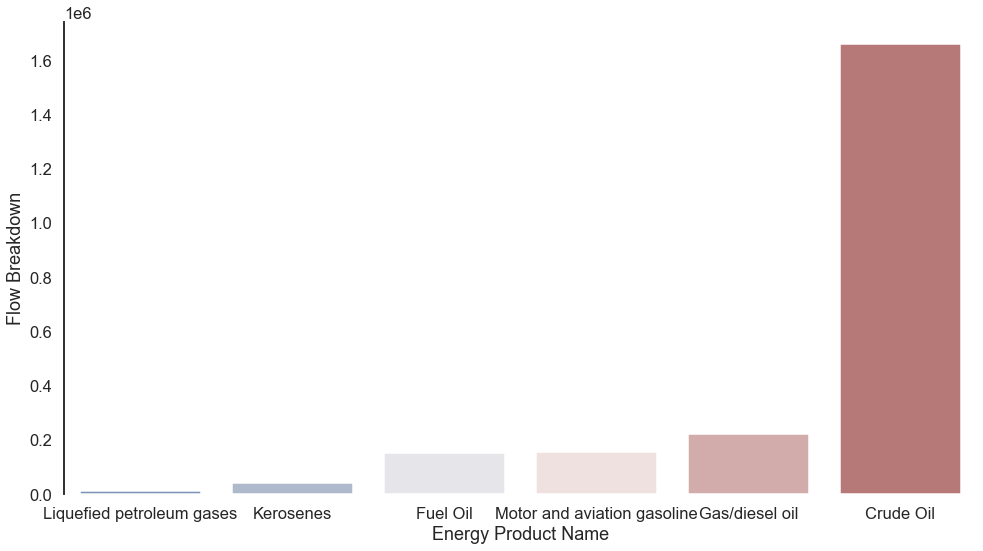

In [ ]:
#5
# energy product for imports ,exports and demand 
#we chose 6 ENERGY PRODUCT 
groups1=Filters_By_Country(df ,'Saudi Arabia').groupby(['ENERGY_PRODUCT_NAME'])["OBS_VALUE"].sum().reset_index(name='size')


plt.figure(figsize=(14,8))
sharex=True
sns.set_theme(style="white", context="talk")
sns.barplot(x='ENERGY_PRODUCT_NAME', y='size', palette="vlag", data=groups1.sort_values(by='size'))
sns.despine(bottom=True)
plt.xlabel('Energy Product Name')
plt.ylabel("Flow Breakdown")
plt.tight_layout(h_pad=2 )

In [ ]:
#6
fig = make_subplots(rows=(Filters_By_Country(df ,'Saudi Arabia').shape[1]-1)//2, cols=2)
for i, col in enumerate(Filters_By_Country(df ,'Saudi Arabia').iloc[:,[0,2,3,5]]):
    _col = (i+1)%2
    _col = _col if _col != 0 else 2
    series = Filters_By_Country(df ,'Saudi Arabia').groupby(col)['OBS_VALUE'].mean()
    fig.add_trace(go.Scatter(y=series, x=series.index, name=col ), row=(i//2)+1, col=_col)
    fig.update_yaxes(title='OBS_VALUE')
        
fig.update_layout(template='plotly_dark', height=1000, width=1500)
fig.show()

<AxesSubplot:xlabel='TIME_PERIOD', ylabel='OBS_VALUE'>

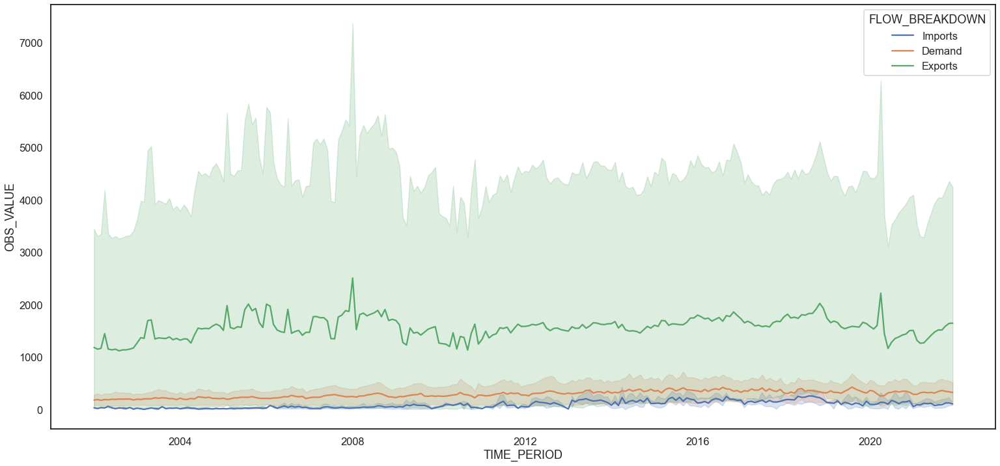

In [ ]:
#9
plt.figure(figsize=(26,12))
sns.lineplot(data=Filters_By_Country(df ,'Saudi Arabia'), x="TIME_PERIOD", y="OBS_VALUE", hue="FLOW_BREAKDOWN")


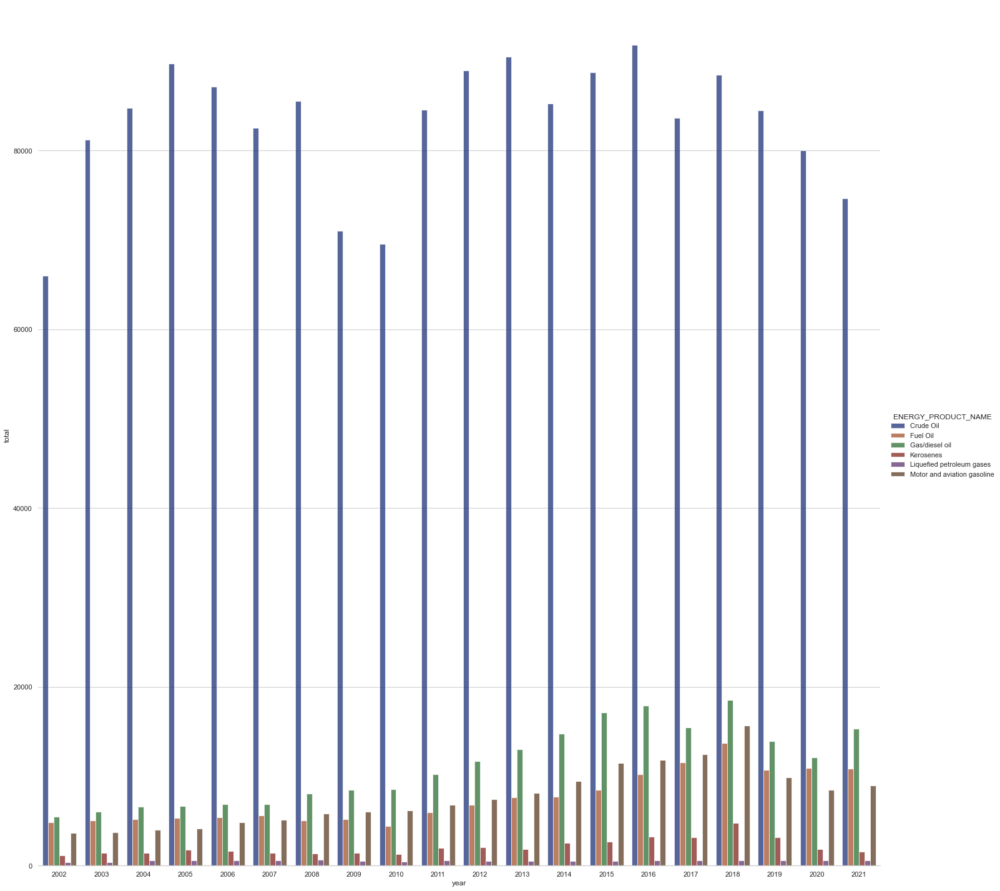

In [ ]:
# ENERGY PRODUCT NAME

sns.set_theme(style="whitegrid")
g = sns.catplot(
    data=SUBSET_ENERGY_PRODUCT_NAME(KSA), kind="bar",
    x="year", y="total", hue="ENERGY_PRODUCT_NAME",
    ci="sd", palette="dark", alpha=.7, height=20
)
g.despine(left=True)

# KSA. Exports

<AxesSubplot:xlabel='TIME_PERIOD', ylabel='OBS_VALUE'>

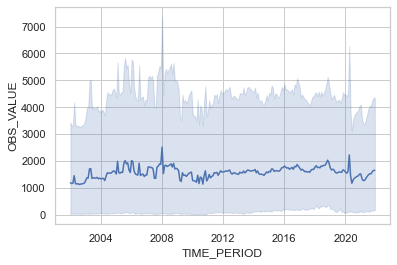

In [ ]:
#OBS_VALUE with TIME_PERIOD for Exports
KSA_exports = Filters_By_Country(df ,'Saudi Arabia').query("FLOW_BREAKDOWN == 'Exports'")
sns.lineplot(data=KSA_exports, x="TIME_PERIOD", y="OBS_VALUE")


<Figure size 720x864 with 0 Axes>

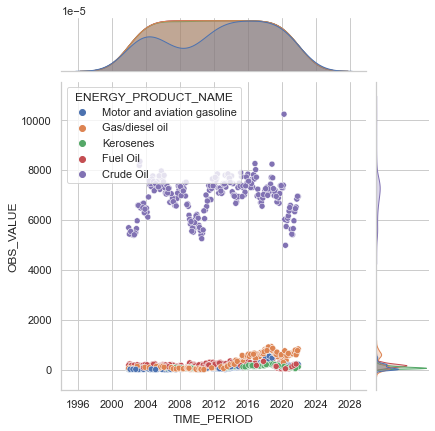

In [ ]:
plt.figure(figsize=(10,12))
sns.jointplot(data=KSA_exports, x="TIME_PERIOD", y="OBS_VALUE", hue="ENERGY_PRODUCT_NAME")


<AxesSubplot:xlabel='ENERGY_PRODUCT_NAME', ylabel='OBS_VALUE'>

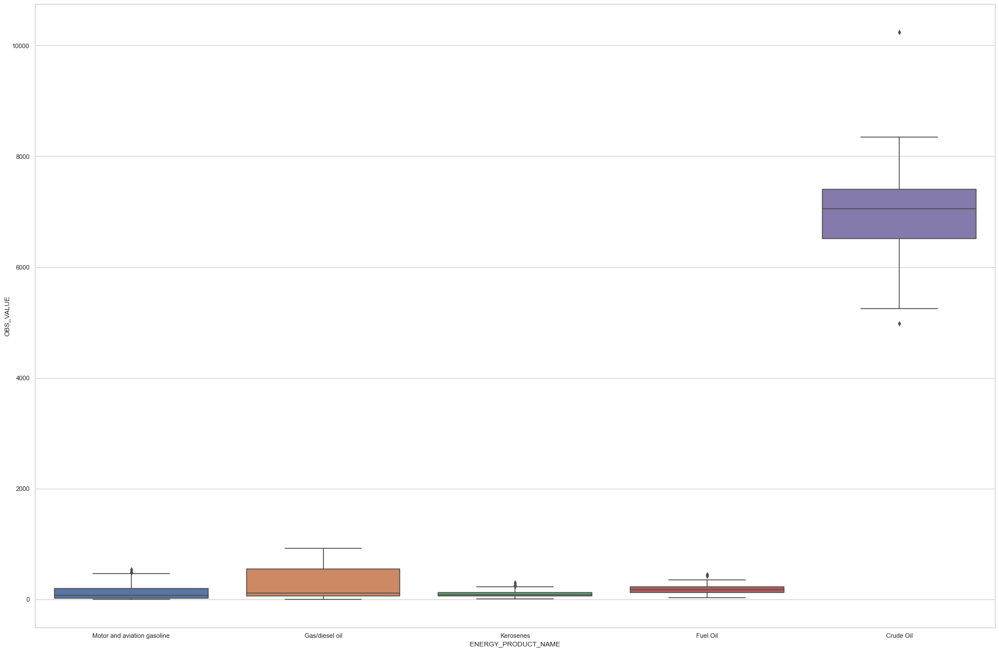

In [ ]:
fig, ax = plt.subplots(figsize=(30, 20))
sns.boxplot(x="ENERGY_PRODUCT_NAME", y="OBS_VALUE", data=KSA_exports)

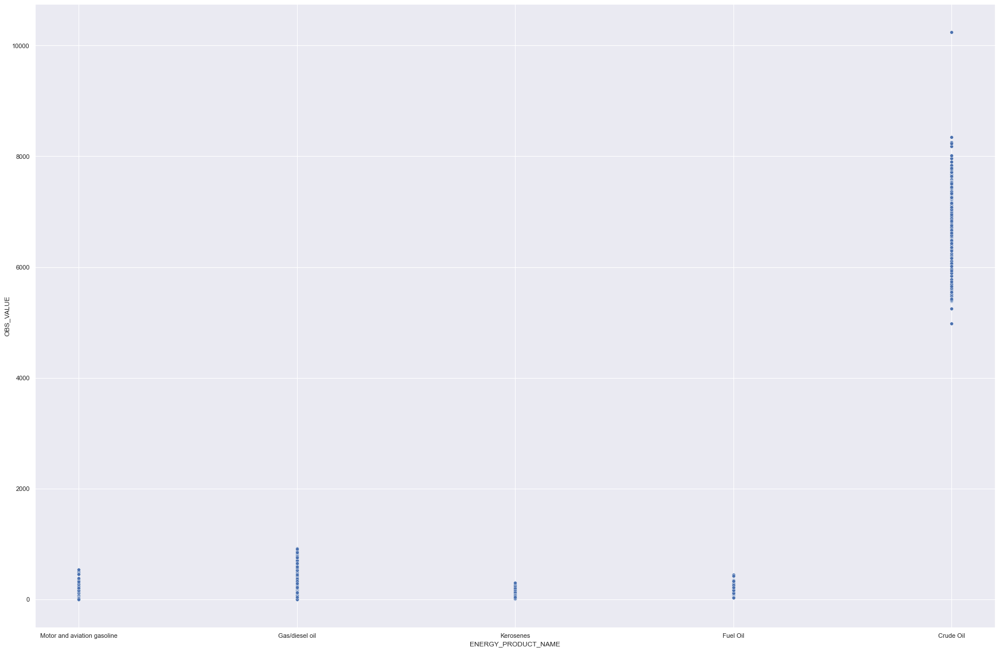

In [ ]:
sns.set(color_codes=True)
fig, ax = plt.subplots(figsize=(30, 20))
ax = sns.scatterplot(x="ENERGY_PRODUCT_NAME", y="OBS_VALUE", data=KSA_exports)
plt.show()



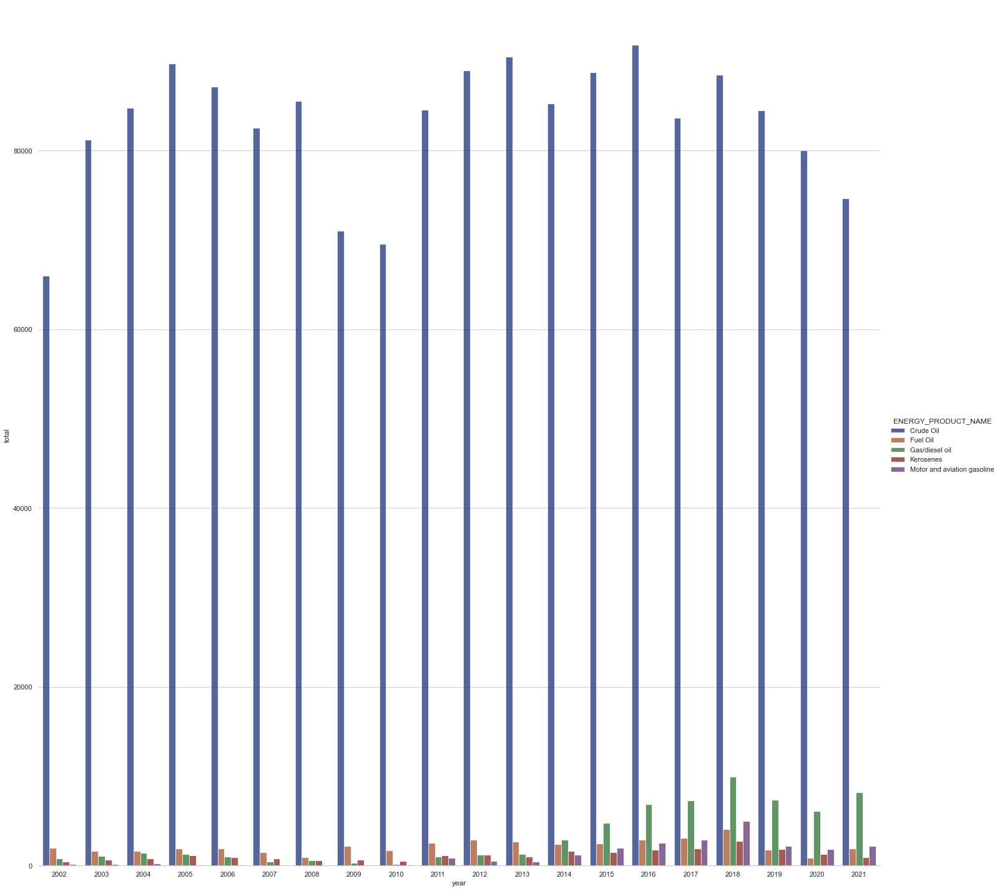

In [ ]:
Export_product = KSA.query("FLOW_BREAKDOWN == 'Exports'")
Export_product = SUBSET_ENERGY_PRODUCT_NAME(Export_product)
sns.set_theme(style="whitegrid")
g = sns.catplot(
    data=Export_product ,kind="bar",
    x="year", y="total", hue="ENERGY_PRODUCT_NAME",
    ci="sd", palette="dark", alpha=.7, height=20
)
g.despine(left=True)

<AxesSubplot:xlabel='ENERGY_PRODUCT_NAME', ylabel='OBS_VALUE'>

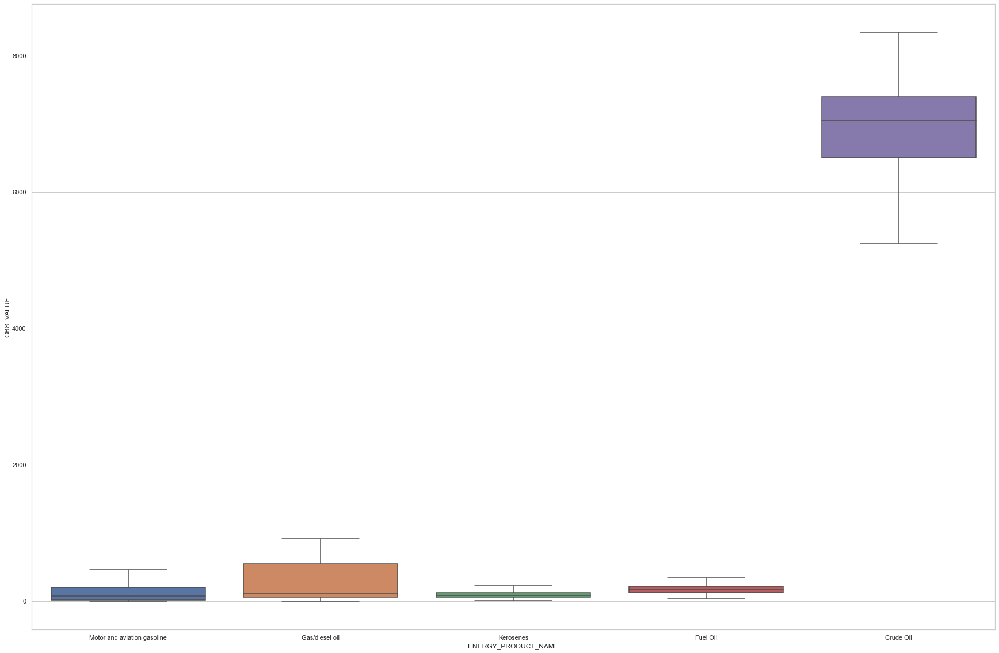

In [ ]:
#delete outlire
fig, ax = plt.subplots(figsize=(30, 20))
sns.boxplot(x="ENERGY_PRODUCT_NAME", y="OBS_VALUE", data=KSA_exports , showfliers = False)

In [ ]:
 delete_outlire(KSA_exports)

,TIME_PERIOD,AREA,ENERGY_PRODUCT_NAME,FLOW_BREAKDOWN,UNIT_MEASURE,OBS_VALUE,ASSESSMENT_CODE,year
94,2006-10-01,Saudi Arabia,Motor and aviation gasoline,Exports,KBD,18.0,3,2006
537,2010-03-01,Saudi Arabia,Motor and aviation gasoline,Exports,KBD,8.0,3,2010
550,2010-04-01,Saudi Arabia,Motor and aviation gasoline,Exports,KBD,9.0,3,2010
678,2011-05-01,Saudi Arabia,Motor and aviation gasoline,Exports,KBD,78.0,3,2011
705,2011-07-01,Saudi Arabia,Motor and aviation gasoline,Exports,KBD,83.0,3,2011
...,...,...,...,...,...,...,...,...
948762,2019-05-01,Saudi Arabia,Fuel Oil,Exports,KBD,128.0,3,2019
948895,2020-06-01,Saudi Arabia,Fuel Oil,Exports,KBD,32.0,3,2020
948984,2021-03-01,Saudi Arabia,Fuel Oil,Exports,KBD,117.0,3,2021
949007,2021-06-01,Saudi Arabia,Fuel Oil,Exports,KBD,169.0,3,2021


# KSA. Imports

<AxesSubplot:xlabel='TIME_PERIOD', ylabel='OBS_VALUE'>

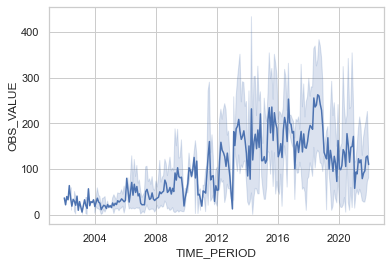

In [ ]:
##OBS_VALUE with TIME_PERIOD for Imports
KSA_imports = Filters_By_Country(df ,'Saudi Arabia').query("FLOW_BREAKDOWN == 'Imports'")
sns.lineplot(data=KSA_imports, x="TIME_PERIOD", y="OBS_VALUE")

<Figure size 720x864 with 0 Axes>

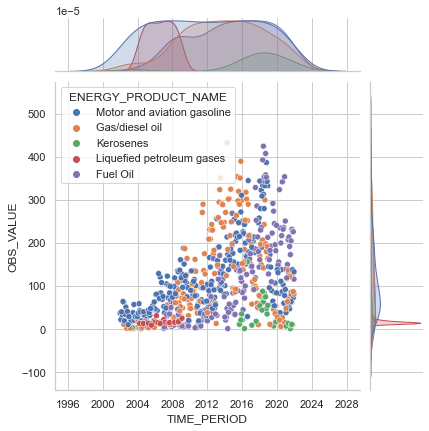

In [ ]:
plt.figure(figsize=(10,12))
sns.jointplot(data=KSA_imports, x="TIME_PERIOD", y="OBS_VALUE", hue="ENERGY_PRODUCT_NAME")


<AxesSubplot:xlabel='ENERGY_PRODUCT_NAME', ylabel='OBS_VALUE'>

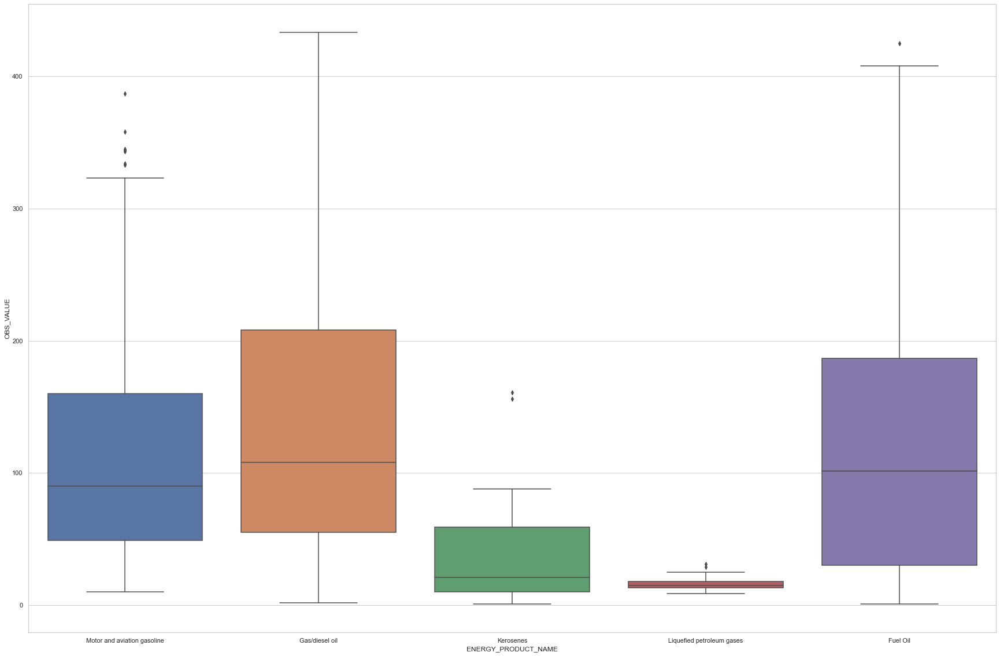

In [ ]:
fig, ax = plt.subplots(figsize=(30, 20))
sns.boxplot(x="ENERGY_PRODUCT_NAME", y="OBS_VALUE", data=KSA_imports)

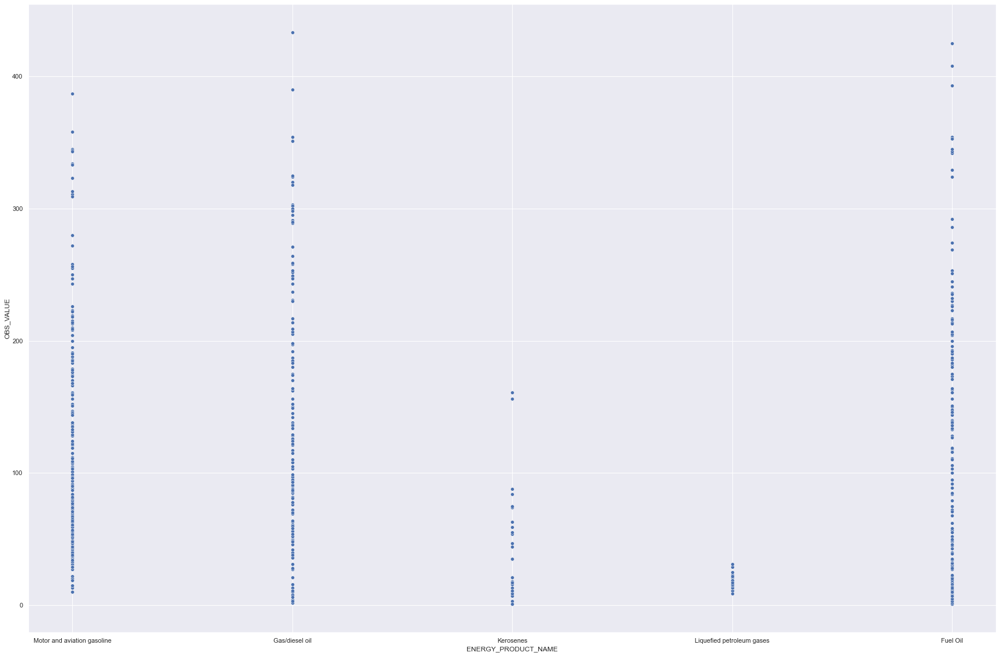

In [ ]:
sns.set(color_codes=True)
fig, ax = plt.subplots(figsize=(30, 20))
ax = sns.scatterplot(x="ENERGY_PRODUCT_NAME", y="OBS_VALUE", data=KSA_imports)
plt.show()


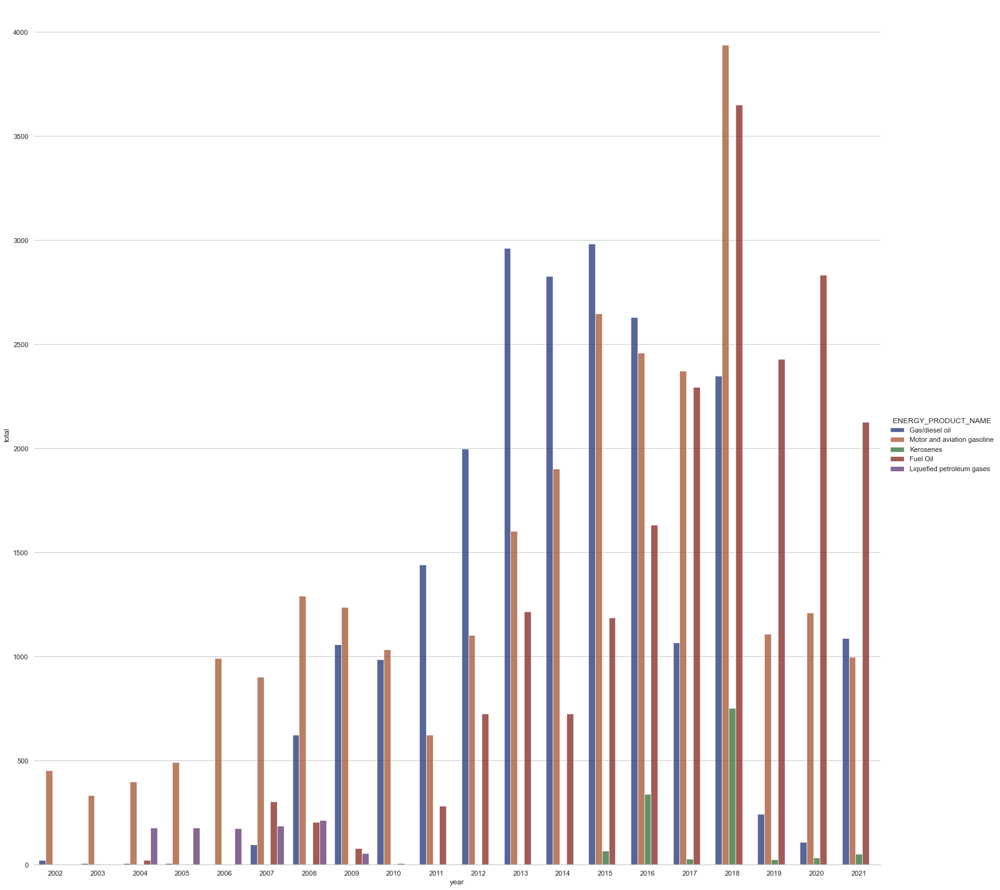

In [ ]:
Import_product = KSA.query("FLOW_BREAKDOWN == 'Imports'")
Import_product = SUBSET_ENERGY_PRODUCT_NAME(Import_product)
#df['DataFrame Column'] = pd.to_numeric(df['DataFrame Column'])
sns.set_theme(style="whitegrid")
g = sns.catplot(
    data=Import_product ,kind="bar",
    x="year", y="total", hue="ENERGY_PRODUCT_NAME",
    ci="sd", palette="dark", alpha=.7, height=20
)
g.despine(left=True)

<AxesSubplot:xlabel='ENERGY_PRODUCT_NAME', ylabel='OBS_VALUE'>

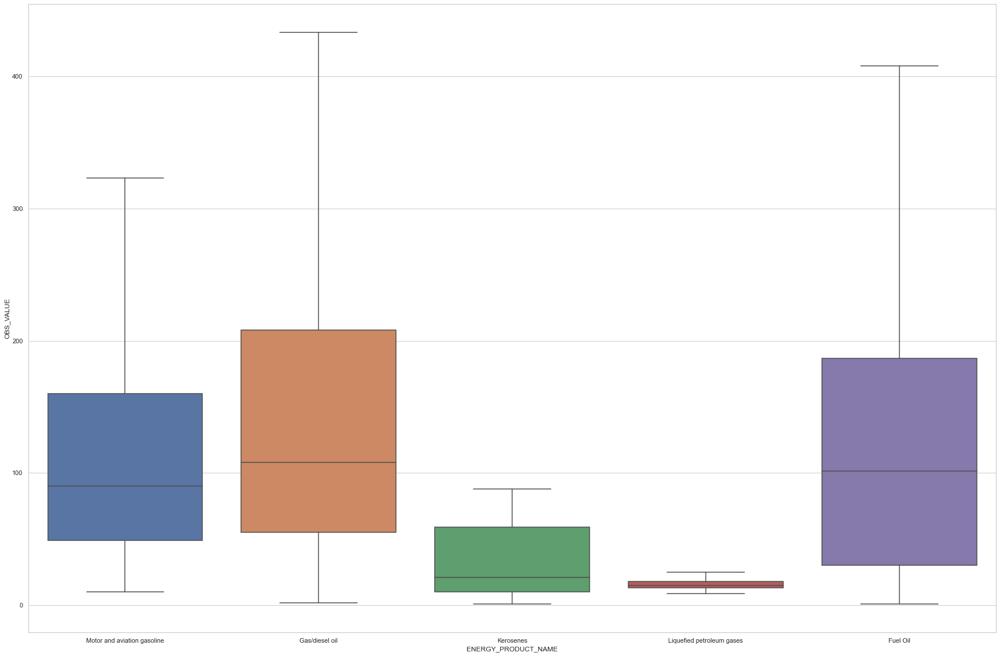

In [ ]:
#delete outlire
fig, ax = plt.subplots(figsize=(30, 20))
sns.boxplot(x="ENERGY_PRODUCT_NAME", y="OBS_VALUE", data=KSA_imports , showfliers = False)

# KSA. Demand

<AxesSubplot:xlabel='TIME_PERIOD', ylabel='OBS_VALUE'>

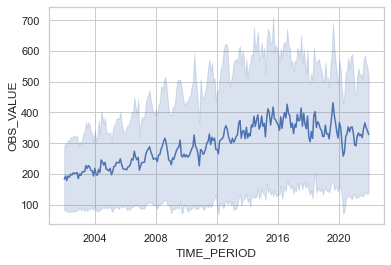

In [ ]:
##OBS_VALUE with TIME_PERIOD for Imports
KSA_Demand = Filters_By_Country(df ,'Saudi Arabia').query("FLOW_BREAKDOWN == 'Demand'")
sns.lineplot(data=KSA_Demand, x="TIME_PERIOD", y="OBS_VALUE")

<Figure size 720x864 with 0 Axes>

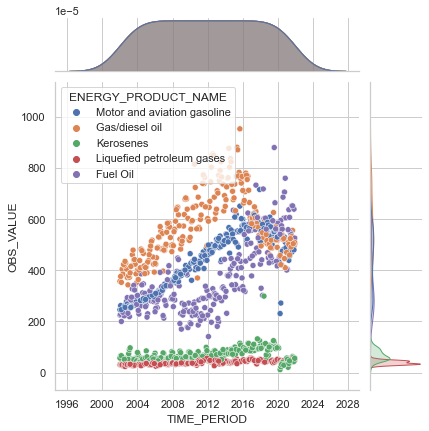

In [ ]:
plt.figure(figsize=(10,12))
sns.jointplot(data=KSA_Demand, x="TIME_PERIOD", y="OBS_VALUE", hue="ENERGY_PRODUCT_NAME")

<AxesSubplot:xlabel='ENERGY_PRODUCT_NAME', ylabel='OBS_VALUE'>

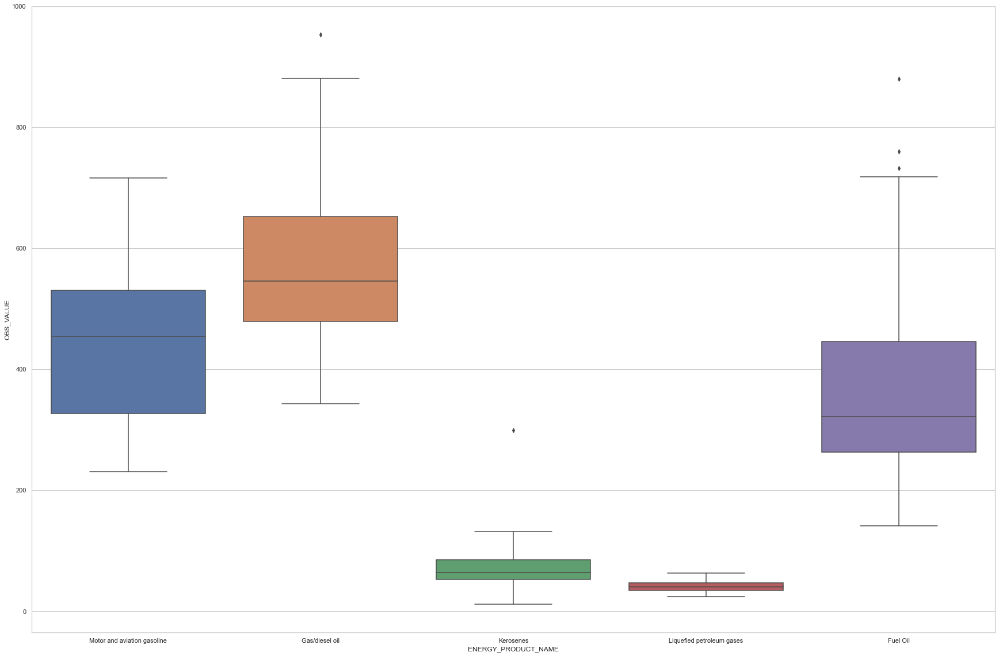

In [ ]:
fig, ax = plt.subplots(figsize=(30, 20))
sns.boxplot(x="ENERGY_PRODUCT_NAME", y="OBS_VALUE", data=KSA_Demand)

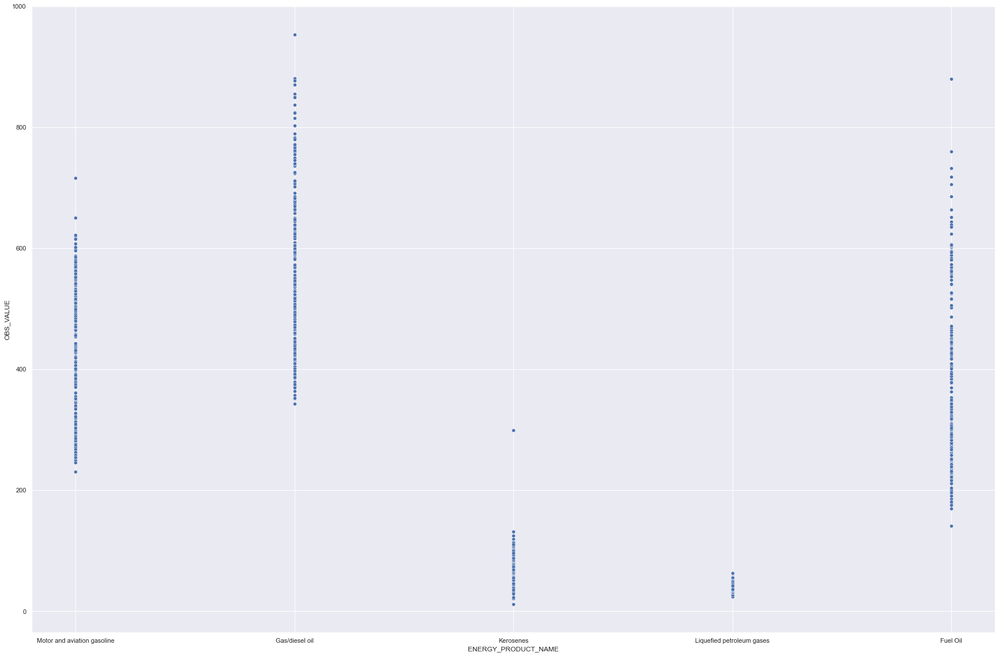

In [ ]:
sns.set(color_codes=True)
fig, ax = plt.subplots(figsize=(30, 20))
ax = sns.scatterplot(x="ENERGY_PRODUCT_NAME", y="OBS_VALUE", data=KSA_Demand)
plt.show()

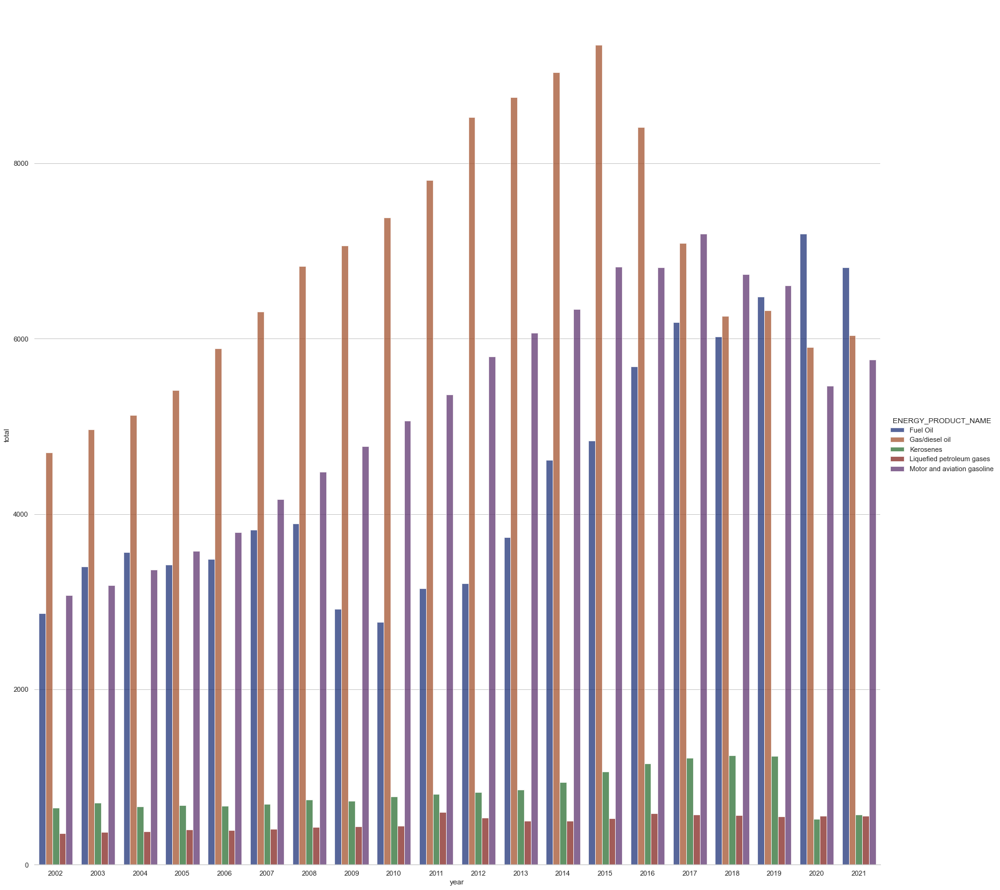

In [ ]:
Demand_product = KSA.query("FLOW_BREAKDOWN == 'Demand'")
Demand_product = SUBSET_ENERGY_PRODUCT_NAME(Demand_product)
sns.set_theme(style="whitegrid")
g = sns.catplot(
    data=Demand_product ,kind="bar",
    x="year", y="total", hue="ENERGY_PRODUCT_NAME",
    ci="sd", palette="dark", alpha=.7, height=20
)
g.despine(left=True)

<AxesSubplot:xlabel='ENERGY_PRODUCT_NAME', ylabel='OBS_VALUE'>

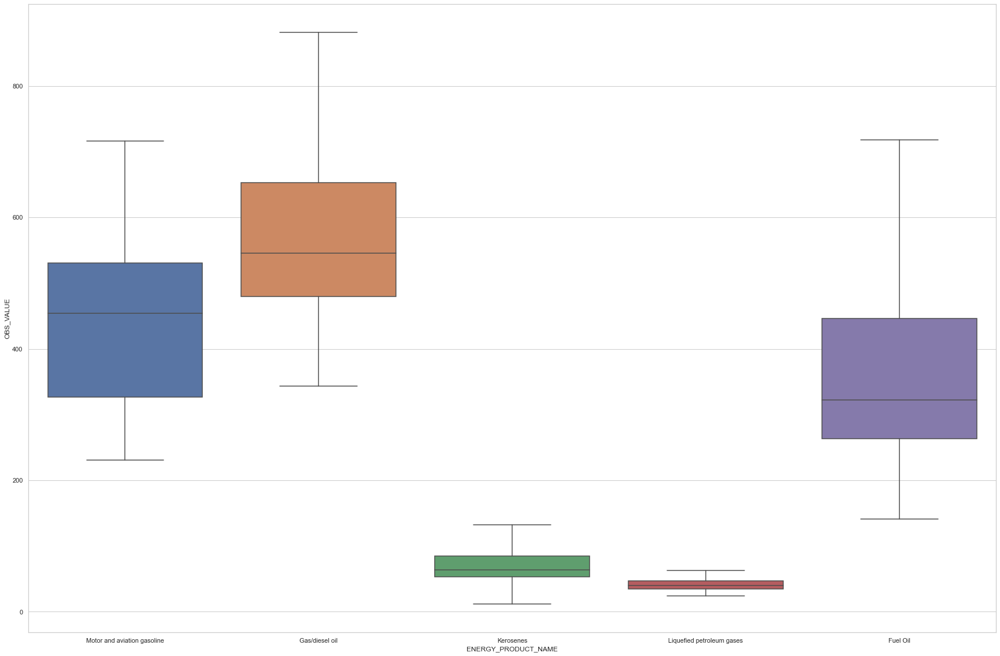

In [ ]:
#delete outlire
fig, ax = plt.subplots(figsize=(30, 20))
sns.boxplot(x="ENERGY_PRODUCT_NAME", y="OBS_VALUE", data=KSA_Demand , showfliers = False)

# -------------------------------------------

In [ ]:
#In this function we remove crude oil from comparison since it is linked with OPEC quota Which's mean fixed 
#and dosen't make any change in production differences between contries


def Filters_Country(df , i ):
    contry = df[df['AREA']==i]
    contry=contry[(contry['UNIT_MEASURE']=='KBD')]
    contry=contry[(contry['FLOW_BREAKDOWN']=='Imports' )|
               (contry['FLOW_BREAKDOWN']=='Demand')|
               (contry['FLOW_BREAKDOWN']=='Exports')]
    contry=contry[(contry['ENERGY_PRODUCT_NAME']=='Motor and aviation gasoline' )|
               (contry['ENERGY_PRODUCT_NAME']=='Fuel Oil')|
               (contry['ENERGY_PRODUCT_NAME']=='Gas/diesel oil' )|
               (contry['ENERGY_PRODUCT_NAME']=='Kerosenes')|
               (contry['ENERGY_PRODUCT_NAME']=='Liquefied petroleum gases')]
    return contry

# Gcc

### KSA Imports ,Exports And Demand

In [ ]:
KSA_ = Filters_Country(df ,'Saudi Arabia')

In [ ]:
fig = px.line(SUBSET_FLOW_BREAKDOWN(KSA_), x="year", y="total", color='FLOW_BREAKDOWN')
fig.show()

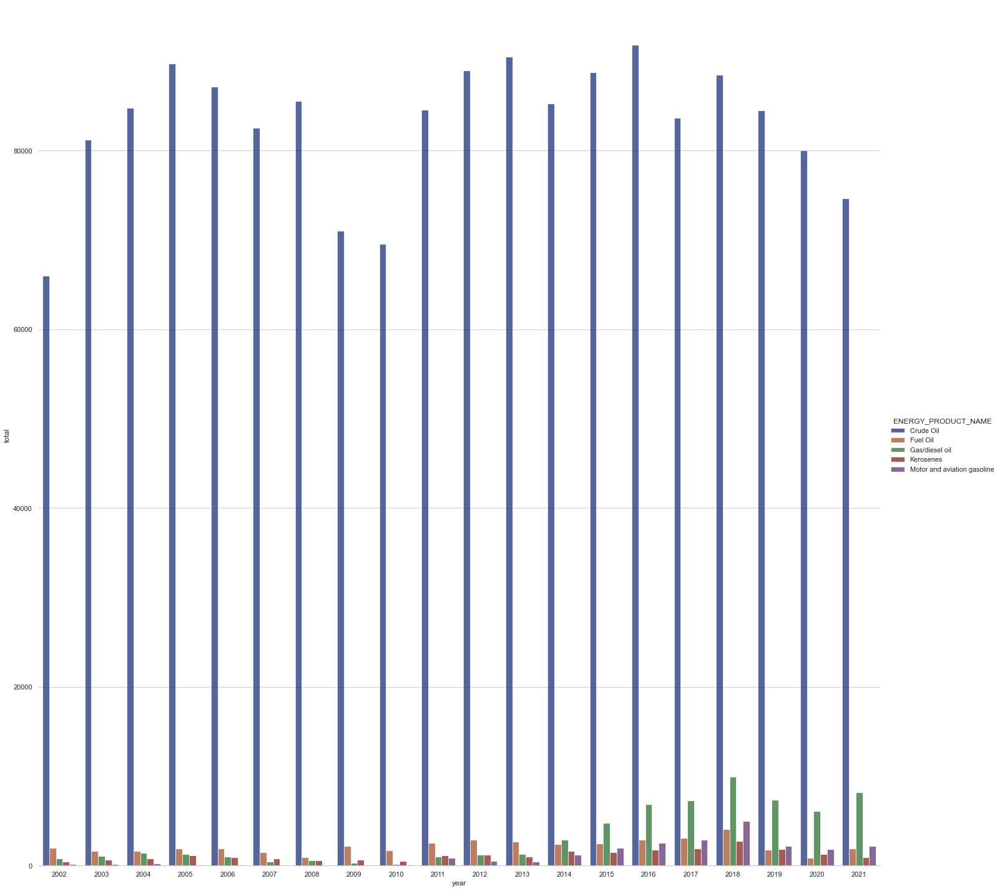

In [ ]:
Export_product = KSA.query("FLOW_BREAKDOWN == 'Exports'")
Export_product = SUBSET_ENERGY_PRODUCT_NAME(Export_product)
sns.set_theme(style="whitegrid")
g = sns.catplot(
    data=Export_product ,kind="bar",
    x="year", y="total", hue="ENERGY_PRODUCT_NAME",
    ci="sd", palette="dark", alpha=.7, height=20
)
g.despine(left=True)

### UAE Imports ,Exports And Demand

In [ ]:
UAE = Filters_Country(df ,'United Arab Emirates')

In [ ]:
#3
#qq = px.data.gapminder().query("continent=='Oceania'")
fig = px.line(SUBSET_FLOW_BREAKDOWN(UAE), x="year", y="total", color='FLOW_BREAKDOWN')
fig.show()

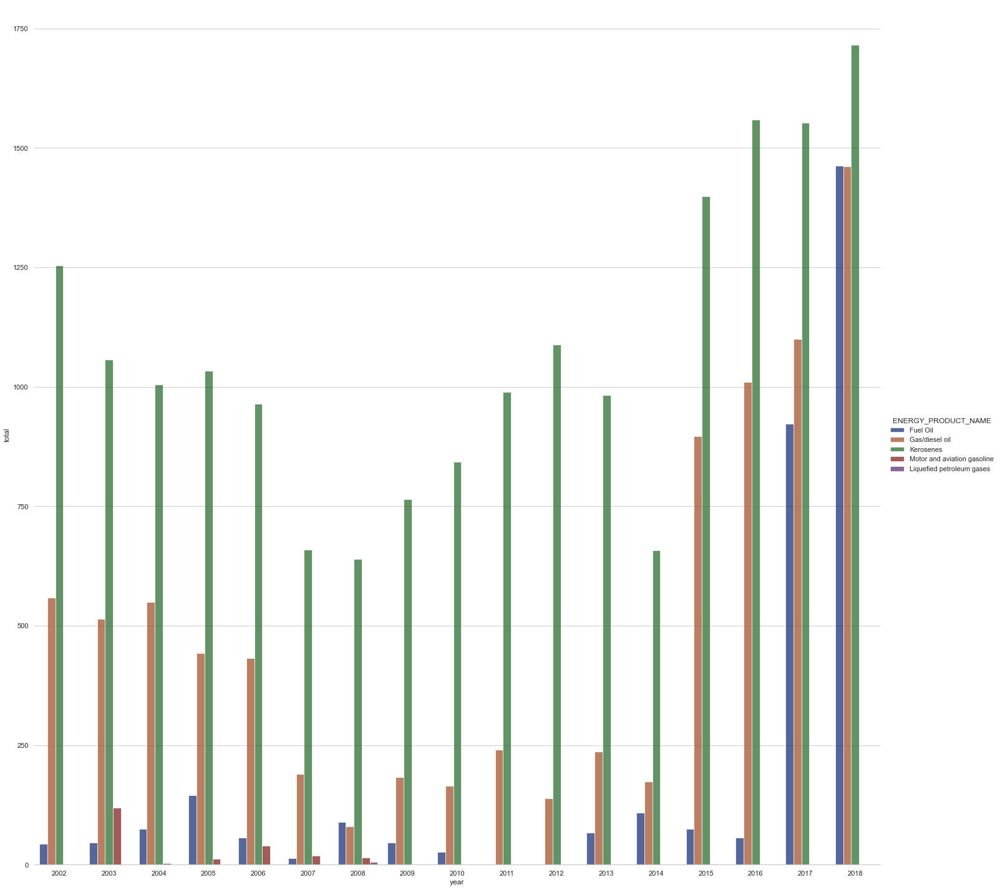

In [ ]:
Export_product =UAE.query("FLOW_BREAKDOWN == 'Exports'")
Export_product = SUBSET_ENERGY_PRODUCT_NAME(Export_product)
sns.set_theme(style="whitegrid")
g = sns.catplot(
    data=Export_product ,kind="bar",
    x="year", y="total", hue="ENERGY_PRODUCT_NAME",
    ci="sd", palette="dark", alpha=.7, height=20
)
g.despine(left=True)

### Oman. Imports ,Exports And Demand

In [ ]:
Oman = Filters_Country(df ,'Oman')

In [ ]:
fig = px.line(SUBSET_FLOW_BREAKDOWN(Oman), x="year", y="total", color='FLOW_BREAKDOWN')
fig.show()

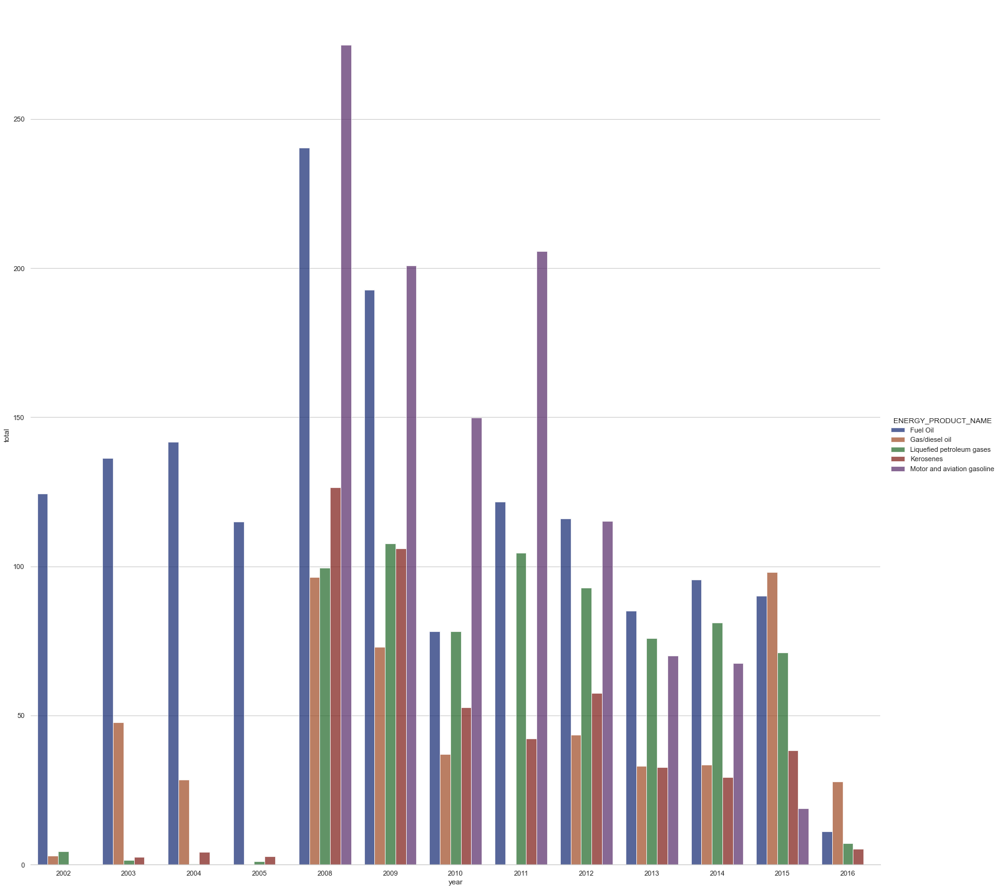

In [ ]:
Export_product = Oman.query("FLOW_BREAKDOWN == 'Exports'")
Export_product = SUBSET_ENERGY_PRODUCT_NAME(Export_product)
sns.set_theme(style="whitegrid")
g = sns.catplot(
    data=Export_product ,kind="bar",
    x="year", y="total", hue="ENERGY_PRODUCT_NAME",
    ci="sd", palette="dark", alpha=.7, height=20
)
g.despine(left=True)

### Qatar. Imports ,Exports And Demand

In [ ]:
QAT = Filters_Country(df ,'Qatar')

In [ ]:
fig = px.line(SUBSET_FLOW_BREAKDOWN(QAT), x="year", y="total", color='FLOW_BREAKDOWN')
fig.show()

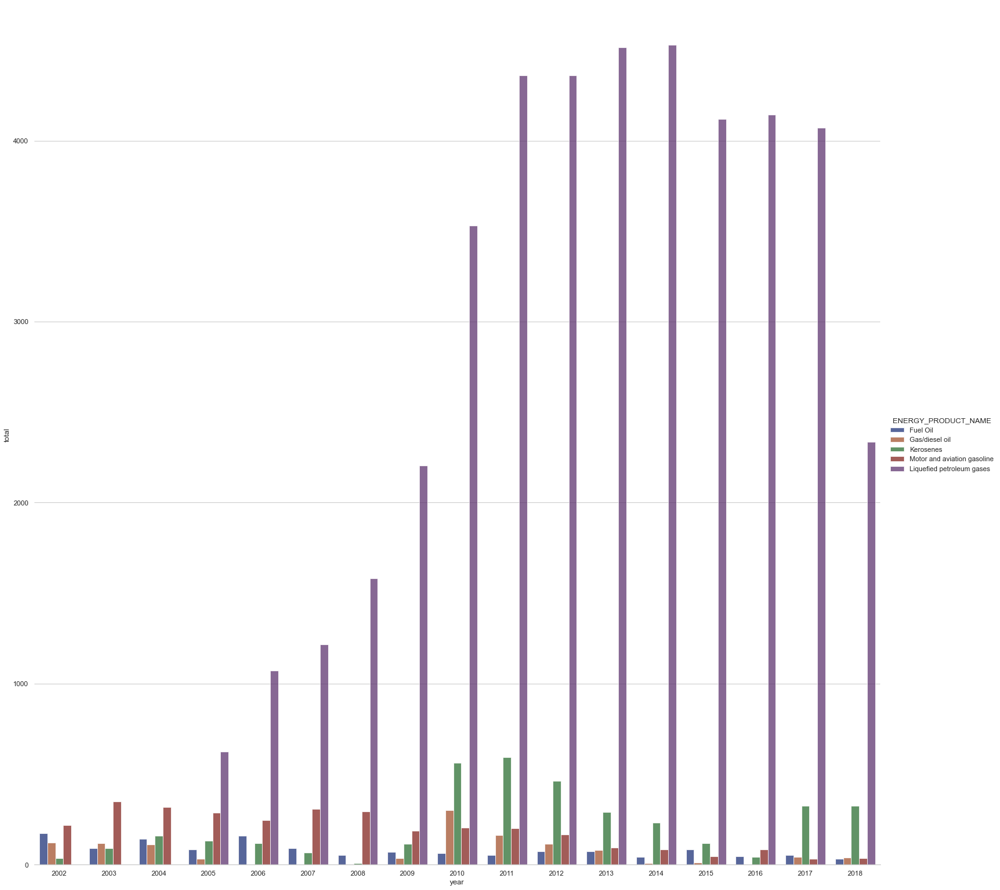

In [ ]:
Export_product =  QAT.query("FLOW_BREAKDOWN == 'Exports'")
Export_product = SUBSET_ENERGY_PRODUCT_NAME(Export_product)
sns.set_theme(style="whitegrid")
g = sns.catplot(
    data=Export_product ,kind="bar",
    x="year", y="total", hue="ENERGY_PRODUCT_NAME",
    ci="sd", palette="dark", alpha=.7, height=20
)
g.despine(left=True)

### Bahrain. Imports ,Exports And Demand

In [ ]:
BH = Filters_Country(df ,'Bahrain')

In [ ]:
fig = px.line(SUBSET_FLOW_BREAKDOWN(BH), x="year", y="total", color='FLOW_BREAKDOWN')
fig.show()

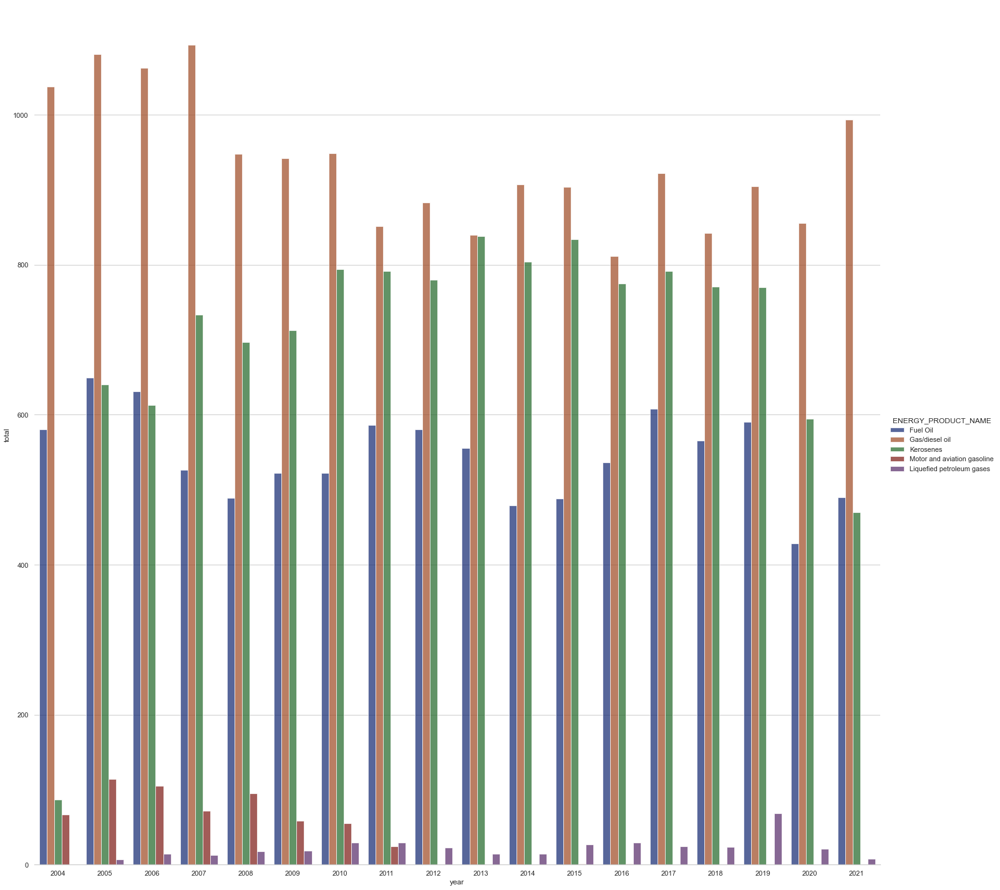

In [ ]:
Export_product =  BH.query("FLOW_BREAKDOWN == 'Exports'")
Export_product = SUBSET_ENERGY_PRODUCT_NAME(Export_product)
sns.set_theme(style="whitegrid")
g = sns.catplot(
    data=Export_product ,kind="bar",
    x="year", y="total", hue="ENERGY_PRODUCT_NAME",
    ci="sd", palette="dark", alpha=.7, height=20
)
g.despine(left=True)

### Kuwait. Imports ,Exports And Demand

In [ ]:
KWT = Filters_Country(df ,'Kuwait')

In [ ]:
fig = px.line(SUBSET_FLOW_BREAKDOWN(KWT), x="year", y="total", color='FLOW_BREAKDOWN')
fig.show()

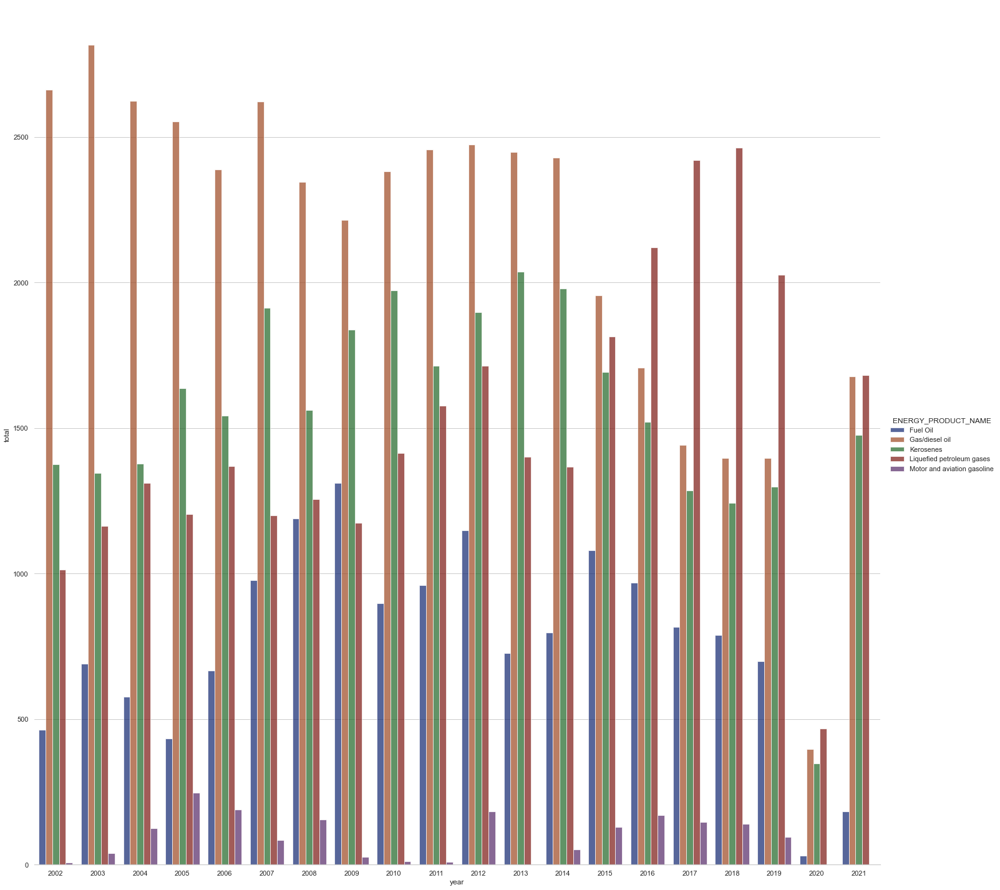

In [ ]:
Export_product = KWT.query("FLOW_BREAKDOWN == 'Exports'")
Export_product = SUBSET_ENERGY_PRODUCT_NAME(Export_product)
sns.set_theme(style="whitegrid")
g = sns.catplot(
    data=Export_product ,kind="bar",
    x="year", y="total", hue="ENERGY_PRODUCT_NAME",
    ci="sd", palette="dark", alpha=.7, height=20
)
g.despine(left=True)

# ---------------------------------------------------------------

# Machine Learning Models-ML

In [ ]:
#Function for filter data by Country
def FiltersByCountry(df ):
    contry = df[(df['AREA']=='Saudi Arabia') | (df['AREA']=='Kuwait')]
    contry=contry[(contry['UNIT_MEASURE']=='KBD')]
    contry=contry[(contry['FLOW_BREAKDOWN']=='Imports' )|
               (contry['FLOW_BREAKDOWN']=='Demand')|
               (contry['FLOW_BREAKDOWN']=='Exports')]
    contry=contry[(contry['ENERGY_PRODUCT_NAME']=='Motor and aviation gasoline' )|
               (contry['ENERGY_PRODUCT_NAME']=='Fuel Oil')|
               (contry['ENERGY_PRODUCT_NAME']=='Gas/diesel oil' )]
    return contry



#convert the name of the Energy product into numbers 
def EPC(x):
    if x.ENERGY_PRODUCT_NAME == 'Fuel Oil':
        x.ENERGY_PRODUCT_NAME = 1
    elif x.ENERGY_PRODUCT_NAME == 'Gas/diesel oil':
        x.ENERGY_PRODUCT_NAME = 2
    elif x.ENERGY_PRODUCT_NAME == 'Motor and aviation gasoline':
        x.ENERGY_PRODUCT_NAME = 3
        
    return x.ENERGY_PRODUCT_NAME  



#convert the name of the movement of energy products into numbers 

def FBC(x):
    if x.FLOW_BREAKDOWN == 'Imports':
        x.FLOW_BREAKDOWN = 1
    elif x.FLOW_BREAKDOWN == 'Demand':
        x.FLOW_BREAKDOWN = 2
    elif x.FLOW_BREAKDOWN == 'Exports':
        x.FLOW_BREAKDOWN = 3
        
    return x.FLOW_BREAKDOWN

#convert the name of the Country to numbers
def CC(x):
    if x.AREA == 'Saudi Arabia':
        x.AREA = 1
    elif x.AREA == 'Kuwait':
        x.AREA = 2
    elif x.AREA == 'Bahrain':
        x.AREA = 3
        
    return x.AREA

## Split Data

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
KSA = FiltersByCountry(df)

In [ ]:
# split column and add new columns to df

KSA[['YEAR', 'MONTH']] = KSA['TIME_PERIOD'].str.split('-', expand=True)
# display the dataframe
KSA['ENERGY_PRODUCT_NAME'] = KSA.apply(EPC, axis=1)
KSA['FLOW_BREAKDOWN'] = KSA.apply(FBC, axis=1)
KSA['AREA'] = KSA.apply(CC, axis=1)

In [ ]:
KSA.dtypes

TIME_PERIOD             object
AREA                     int64
ENERGY_PRODUCT_NAME      int64
FLOW_BREAKDOWN           int64
UNIT_MEASURE            object
OBS_VALUE              float64
ASSESSMENT_CODE          int64
year                     int64
YEAR                    object
MONTH                   object
dtype: object

In [ ]:
x=KSA.iloc[:, [1,2, 3,6,8,9]].values
y=KSA.iloc[:, [5]].values


In [ ]:

X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.50, random_state = 10)
print(X_train)
print(y_train)
print(X_test)
print(y_test)



[[2 2 2 3 '2008' '07']
 [1 2 2 3 '2009' '03']
 [1 2 2 3 '2008' '03']
 ...
 [2 1 3 3 '2003' '04']
 [2 1 2 3 '2010' '07']
 [2 3 3 3 '2003' '10']]
[[ 42.]
 [531.]
 [551.]
 ...
 [ 80.]
 [112.]
 [  7.]]
[[2 1 3 3 '2017' '06']
 [1 3 3 3 '2011' '06']
 [1 1 2 3 '2013' '01']
 ...
 [2 1 2 3 '2017' '05']
 [1 1 2 3 '2008' '06']
 [1 1 2 3 '2009' '04']]
[[ 57.]
 [ 65.]
 [303.]
 ...
 [106.]
 [350.]
 [238.]]


In [ ]:
# Pipeline
from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline
from sklearn.compose import ColumnTransformer

# Preprocessing
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder

# Models
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression



In [ ]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)
print(X_train)
print(X_test)

[[ 1.23665718  0.05607204 -0.3212008   0.25080933 -0.63142477  0.18618389]
 [-0.80863154  0.05607204 -0.3212008   0.25080933 -0.45539055 -0.96534593]
 [-0.80863154  0.05607204 -0.3212008   0.25080933 -0.63142477 -0.96534593]
 ...
 [ 1.23665718 -1.16928901  1.05693563  0.25080933 -1.51159588 -0.67746347]
 [ 1.23665718 -1.16928901 -0.3212008   0.25080933 -0.27935632  0.18618389]
 [ 1.23665718  1.2814331   1.05693563  0.25080933 -1.51159588  1.04983126]]
[[ 1.23665718 -1.16928901  1.05693563  0.25080933  0.95288324 -0.10169856]
 [-0.80863154  1.2814331   1.05693563  0.25080933 -0.1033221  -0.10169856]
 [-0.80863154 -1.16928901 -0.3212008   0.25080933  0.24874635 -1.54111084]
 ...
 [ 1.23665718 -1.16928901 -0.3212008   0.25080933  0.95288324 -0.38958102]
 [-0.80863154 -1.16928901 -0.3212008   0.25080933 -0.63142477 -0.10169856]
 [-0.80863154 -1.16928901 -0.3212008   0.25080933 -0.45539055 -0.67746347]]


In [ ]:
from sklearn.neighbors import KNeighborsClassifier
classifier = KNeighborsClassifier(n_neighbors = 5, metric = 'minkowski', p = 2)
classifier.fit(X_train, y_train.astype('int'))

/Users/asmaalsubaie/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:198: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



KNeighborsClassifier()

### 1st Regression Model ((Multiple Regression)

In [ ]:
from sklearn.linear_model import LinearRegression
regressor_1 = LinearRegression()
regressor_1.fit(X_train, y_train)

LinearRegression()

In [ ]:
y_pred_reg1 = regressor_1.predict(X_test)
y_pred_reg1

array([[161.72197896],
       [259.69418257],
       [270.38710759],
       ...,
       [133.9689092 ],
       [232.10653625],
       [237.57347073]])

### 2nd Regression Model (RandomForestRegressor)

In [ ]:
from sklearn.ensemble import RandomForestRegressor
regressor_2 = RandomForestRegressor(n_estimators = 10, random_state = 0)
regressor_2.fit(X_train, y_train)

/var/folders/nr/fsxkqht10339qll1m83sf73r0000gn/T/ipykernel_81486/1959698911.py:3: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



RandomForestRegressor(n_estimators=10, random_state=0)

In [ ]:
y_pred_reg2 = regressor_2.predict(X_test)
y_pred_reg2

array([ 68.6,  85.6, 232.2, ..., 115. , 379.2, 260.2])

### 3rd Regression Model (Polynomial)

In [ ]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn import linear_model

In [ ]:
poly = PolynomialFeatures(degree=2)

In [ ]:
train_x_poly = poly.fit_transform(X_train)

In [ ]:
clf = linear_model.LinearRegression()

In [ ]:
train_y_ = clf.fit(train_x_poly,y_train)

In [ ]:
test_x_poly = poly.fit_transform(X_test)

In [ ]:
test_y_ = clf.predict(test_x_poly)

# Model Evaluation

### 1st Model  Evaluation

In [ ]:
from sklearn.metrics import r2_score

In [ ]:
#model 1
print("Mean absolute error: %.2f" % np.mean(np.absolute(y_pred_reg1 - y_test)))
print("Residual sum of squares (MSE): %.2f" % np.mean((y_pred_reg1 - y_test) ** 2))
print("R2-score: %.2f" % r2_score(y_test , y_pred_reg1) )

Mean absolute error: 122.59
Residual sum of squares (MSE): 25372.72
R2-score: 0.30


In [ ]:
#model 2
print("Mean absolute error: %.2f" % np.mean(np.absolute(y_pred_reg2 - y_test)))
print("Residual sum of squares (MSE): %.2f" % np.mean((y_pred_reg2 - y_test) ** 2))
print("R2-score: %.2f" % r2_score(y_test , y_pred_reg2) )

Mean absolute error: 198.09
Residual sum of squares (MSE): 71404.98
R2-score: 0.95


In [ ]:
#midel3
print("Mean absolute error: %.2f" % np.mean(np.absolute(test_y_ - y_test)))
print("Residual sum of squares (MSE): %.2f" % np.mean((test_y_ - y_test) ** 2))
print("R2-score: %.2f" % r2_score(y_test , test_y_) )

Mean absolute error: 73.09
Residual sum of squares (MSE): 11184.34
R2-score: 0.69


# Model Optimization - Hyperparameter Tuning 

In [ ]:
c= [1,2,3,4]
for i in c :
    poly = PolynomialFeatures(degree=i)
    train_x_poly = poly.fit_transform(X_train)
    clf = linear_model.LinearRegression()
    train_y_ = clf.fit(train_x_poly,y_train)
    test_x_poly = poly.fit_transform(X_test)
    test_y_ = clf.predict(test_x_poly)
    print(i)
    print("Mean absolute error: %.2f" % np.mean(np.absolute(test_y_ - y_test)))
    print("Residual sum of squares (MSE): %.2f" % np.mean((test_y_ - y_test) ** 2))
    print("R2-score: %.2f" % r2_score(y_test , test_y_) )
    print('------------------------------------------------')

1
Mean absolute error: 122.59
Residual sum of squares (MSE): 25372.72
R2-score: 0.30
------------------------------------------------
2
Mean absolute error: 73.09
Residual sum of squares (MSE): 11184.34
R2-score: 0.69
------------------------------------------------
3
Mean absolute error: 62.66
Residual sum of squares (MSE): 7388.17
R2-score: 0.80
------------------------------------------------
4
Mean absolute error: 50.97
Residual sum of squares (MSE): 5187.31
R2-score: 0.86
------------------------------------------------


***Based on the above tuning, it is found that the increasing in the value of the degree up to 4, give a better results as the value of the R2 score is increased and the (MSE, MAE) are decreased.***

# Pipeline

In [ ]:
#PIPELINE FOR RandomForestRegressor MODEL
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import VarianceThreshold
from sklearn.ensemble import RandomForestRegressor


pipe = Pipeline([
('scaler', StandardScaler()),
('selector', VarianceThreshold()),
('regressor', RandomForestRegressor())
])
pipe.fit(X_train, y_train)
y_pred2 = pipe.predict(X_test)
print("Mean absolute error: %.2f" % np.mean(np.absolute(y_pred2 - y_test)))
print("Residual sum of squares (MSE): %.2f" % np.mean((y_pred2 - y_test) ** 2))
print("R2-score: %.2f" % r2_score(y_test , y_pred2) )



/Users/asmaalsubaie/opt/anaconda3/lib/python3.9/site-packages/sklearn/pipeline.py:394: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



Mean absolute error: 197.78
Residual sum of squares (MSE): 71076.92
R2-score: 0.95


In [ ]:
#PIPELINE FOR MULTPIL MODEL
from sklearn.linear_model import LinearRegression
clf = Pipeline([('estimator', LinearRegression())])

clf.fit(X_train, y_train)

print("Mean absolute error: %.2f" % np.mean(np.absolute(y_pred_reg1 - y_test)))
print("Residual sum of squares (MSE): %.2f" % np.mean((y_pred_reg1 - y_test) ** 2))
print("R2-score: %.2f" % r2_score(y_test , y_pred_reg1) )

Mean absolute error: 122.59
Residual sum of squares (MSE): 25372.72
R2-score: 0.30


In [ ]:
#PIPELINE FOR POLYNOMIAL MODEL
from sklearn.linear_model import Ridge
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
model = make_pipeline(PolynomialFeatures(4), Ridge())
model.fit(X_train, y_train)
y_next_hat = model.predict(X_test)

print("Mean absolute error: %.2f" % np.mean(np.absolute(y_next_hat - y_test)))
print("Residual sum of squares (MSE): %.2f" % np.mean((y_next_hat - y_test) ** 2))
print("R2-score: %.2f" % r2_score(y_test , y_next_hat) )

Mean absolute error: 50.71
Residual sum of squares (MSE): 5163.82
R2-score: 0.86


# GridSearchCV

In [ ]:
## Add
# Create the parameter grid based on the results of random search 
param_grid = {
    'bootstrap': [True],
    'max_depth': [4,5, 6, 7, 8],
    'max_features': [2, 3,4,5],
    'min_samples_leaf': [3, 4, 5],
    'min_samples_split': [8, 10, 12],
    'n_estimators': [100, 200, 300, 1000]
}
# Create a based model
rf = RandomForestRegressor()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = 2, n_jobs = -1, verbose = 2)

In [ ]:
grid_search.fit(X_train, y_train)

Fitting 2 folds for each of 720 candidates, totalling 1440 fits


/Users/asmaalsubaie/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/asmaalsubaie/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/asmaalsubaie/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/asmaalsubaie/opt/anaconda3/lib/python3.9/site-packages/sklearn/mod

[CV] END bootstrap=True, max_depth=4, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, max_depth=4, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, max_depth=4, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=300; total time=   0.8s
[CV] END bootstrap=True, max_depth=4, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=300; total time=   0.4s
[CV] END bootstrap=True, max_depth=4, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, max_depth=4, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=200; total time=   0.6s
[CV] END bootstrap=True, max_depth=4, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, max_depth=4, max_features=2, min_samples_leaf=4

/Users/asmaalsubaie/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/asmaalsubaie/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/asmaalsubaie/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/asmaalsubaie/opt/anaconda3/lib/python3.9/site-packages/sklearn/mod

[CV] END bootstrap=True, max_depth=4, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=1000; total time=   1.8s
[CV] END bootstrap=True, max_depth=4, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=300; total time=   0.8s
[CV] END bootstrap=True, max_depth=4, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=200; total time=   0.3s
[CV] END bootstrap=True, max_depth=4, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=1000; total time=   1.6s
[CV] END bootstrap=True, max_depth=4, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=100; total time=   0.2s
[CV] END bootstrap=True, max_depth=4, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=300; total time=   0.6s
[CV] END bootstrap=True, max_depth=4, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=200; total time=   0.3s
[CV] END bootstrap=True, max_depth=4, max_features=2, min_samples_lea

/Users/asmaalsubaie/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/asmaalsubaie/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/asmaalsubaie/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/asmaalsubaie/opt/anaconda3/lib/python3.9/site-packages/sklearn/mod

[CV] END bootstrap=True, max_depth=4, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=200; total time=   0.3s
[CV] END bootstrap=True, max_depth=4, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=300; total time=   0.8s
[CV] END bootstrap=True, max_depth=4, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=200; total time=   0.2s
[CV] END bootstrap=True, max_depth=4, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=1000; total time=   1.8s
[CV] END bootstrap=True, max_depth=4, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=300; total time=   0.4s
[CV] END bootstrap=True, max_depth=4, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=100; total time=   0.1s
[CV] END bootstrap=True, max_depth=4, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=200; total time=   0.3s
[CV] END bootstrap=True, max_depth=4, max_features=2, min_samples_leaf=

/Users/asmaalsubaie/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/asmaalsubaie/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:680: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/Users/asmaalsubaie/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:926: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



GridSearchCV(cv=2, estimator=RandomForestRegressor(), n_jobs=-1,
             param_grid={'bootstrap': [True], 'max_depth': [4, 5, 6, 7, 8],
                         'max_features': [2, 3, 4, 5],
                         'min_samples_leaf': [3, 4, 5],
                         'min_samples_split': [8, 10, 12],
                         'n_estimators': [100, 200, 300, 1000]},
             verbose=2)

In [ ]:
grid_search.best_params_

{'bootstrap': True,
 'max_depth': 8,
 'max_features': 5,
 'min_samples_leaf': 3,
 'min_samples_split': 8,
 'n_estimators': 1000}

In [ ]:
best_grid = grid_search.best_estimator_

In [ ]:
best_grid

RandomForestRegressor(max_depth=8, max_features=5, min_samples_leaf=3,
                      min_samples_split=8, n_estimators=1000)

In [ ]:
print("Best params: {0}, using {1}".format(grid_search.cv_results_['mean_test_score'], grid_search.best_params_))
results_df = pd.DataFrame(grid_search.cv_results_)

Best params: [0.54021148 0.56807604 0.57684906 0.5689084  0.57568048 0.57600233
 0.56759133 0.56509213 0.57278866 0.5673981  0.57255421 0.56120867
 0.56013803 0.5711324  0.56150172 0.57142876 0.57994412 0.57156353
 0.56150651 0.56785207 0.56407224 0.57801526 0.5660918  0.56810701
 0.57639216 0.5727662  0.58106854 0.56898049 0.55959581 0.56599582
 0.57107477 0.56407415 0.53384262 0.56825158 0.5608058  0.56668812
 0.66424861 0.66049669 0.66368229 0.66122178 0.65562689 0.65919545
 0.65491202 0.66380636 0.65498989 0.65672214 0.65883571 0.66375888
 0.65575169 0.66689565 0.65922096 0.65774658 0.66166348 0.66566406
 0.65847262 0.66377476 0.66571636 0.65628254 0.66105706 0.65742821
 0.66472849 0.66439005 0.66050063 0.66005057 0.66493058 0.65197776
 0.65792557 0.66130794 0.66301676 0.65778595 0.66214046 0.66253446
 0.72044543 0.71054697 0.70951923 0.71307127 0.7182197  0.71351722
 0.7109036  0.7109697  0.70724284 0.71144472 0.70937533 0.71061035
 0.70801576 0.70966814 0.71582467 0.71364006 0.71

In [ ]:
results_df

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_bootstrap,param_max_depth,param_max_features,param_min_samples_leaf,param_min_samples_split,param_n_estimators,params,split0_test_score,split1_test_score,mean_test_score,std_test_score,rank_test_score
0,0.166952,0.011450,0.014863,0.003142,True,4,2,3,8,100,"{'bootstrap': True, 'max_depth': 4, 'max_featu...",0.539239,0.541184,0.540211,0.000973,719
1,0.296559,0.004627,0.031732,0.007668,True,4,2,3,8,200,"{'bootstrap': True, 'max_depth': 4, 'max_featu...",0.569435,0.566717,0.568076,0.001359,703
2,0.458396,0.044238,0.047615,0.009229,True,4,2,3,8,300,"{'bootstrap': True, 'max_depth': 4, 'max_featu...",0.568034,0.585664,0.576849,0.008815,688
3,1.661088,0.000610,0.183941,0.021186,True,4,2,3,8,1000,"{'bootstrap': True, 'max_depth': 4, 'max_featu...",0.555358,0.582459,0.568908,0.013550,700
4,0.164575,0.054870,0.016909,0.004613,True,4,2,3,10,100,"{'bootstrap': True, 'max_depth': 4, 'max_featu...",0.562408,0.588953,0.575680,0.013272,691
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
715,1.196265,0.000880,0.095959,0.000827,True,8,5,5,10,1000,"{'bootstrap': True, 'max_depth': 8, 'max_featu...",0.897931,0.918274,0.908103,0.010171,25
716,0.136352,0.000233,0.008759,0.000197,True,8,5,5,12,100,"{'bootstrap': True, 'max_depth': 8, 'max_featu...",0.891821,0.916760,0.904290,0.012469,57
717,0.258072,0.017655,0.027945,0.003600,True,8,5,5,12,200,"{'bootstrap': True, 'max_depth': 8, 'max_featu...",0.897756,0.915827,0.906792,0.009035,37
718,0.434448,0.011627,0.032860,0.004875,True,8,5,5,12,300,"{'bootstrap': True, 'max_depth': 8, 'max_featu...",0.895036,0.915734,0.905385,0.010349,56


In [ ]:
grid_df = pd.DataFrame(grid_search.cv_results_)

grid_df 

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_bootstrap,param_max_depth,param_max_features,param_min_samples_leaf,param_min_samples_split,param_n_estimators,params,split0_test_score,split1_test_score,mean_test_score,std_test_score,rank_test_score
0,0.166952,0.011450,0.014863,0.003142,True,4,2,3,8,100,"{'bootstrap': True, 'max_depth': 4, 'max_featu...",0.539239,0.541184,0.540211,0.000973,719
1,0.296559,0.004627,0.031732,0.007668,True,4,2,3,8,200,"{'bootstrap': True, 'max_depth': 4, 'max_featu...",0.569435,0.566717,0.568076,0.001359,703
2,0.458396,0.044238,0.047615,0.009229,True,4,2,3,8,300,"{'bootstrap': True, 'max_depth': 4, 'max_featu...",0.568034,0.585664,0.576849,0.008815,688
3,1.661088,0.000610,0.183941,0.021186,True,4,2,3,8,1000,"{'bootstrap': True, 'max_depth': 4, 'max_featu...",0.555358,0.582459,0.568908,0.013550,700
4,0.164575,0.054870,0.016909,0.004613,True,4,2,3,10,100,"{'bootstrap': True, 'max_depth': 4, 'max_featu...",0.562408,0.588953,0.575680,0.013272,691
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
715,1.196265,0.000880,0.095959,0.000827,True,8,5,5,10,1000,"{'bootstrap': True, 'max_depth': 8, 'max_featu...",0.897931,0.918274,0.908103,0.010171,25
716,0.136352,0.000233,0.008759,0.000197,True,8,5,5,12,100,"{'bootstrap': True, 'max_depth': 8, 'max_featu...",0.891821,0.916760,0.904290,0.012469,57
717,0.258072,0.017655,0.027945,0.003600,True,8,5,5,12,200,"{'bootstrap': True, 'max_depth': 8, 'max_featu...",0.897756,0.915827,0.906792,0.009035,37
718,0.434448,0.011627,0.032860,0.004875,True,8,5,5,12,300,"{'bootstrap': True, 'max_depth': 8, 'max_featu...",0.895036,0.915734,0.905385,0.010349,56


In [ ]:
parameters = ['param_max_depth','param_n_estimators','mean_test_score','rank_test_score','param_max_features']

grid_df[parameters]

,param_max_depth,param_n_estimators,mean_test_score,rank_test_score,param_max_features
0,4,100,0.540211,719,2
1,4,200,0.568076,703,2
2,4,300,0.576849,688,2
3,4,1000,0.568908,700,2
4,4,100,0.575680,691,2
...,...,...,...,...,...
715,8,1000,0.908103,25,5
716,8,100,0.904290,57,5
717,8,200,0.906792,37,5
718,8,300,0.905385,56,5


In [ ]:
ss=pd.DataFrame(grid_df[parameters].sort_values(by = ['rank_test_score']))

In [ ]:
ss.to_excel('parameters_score.xlsx', sheet_name='new_sheet_name')


In [ ]:
grid_search.best_score_

0.9190922304469449

In [ ]:
grid_search.best_estimator_.estimators_

[DecisionTreeRegressor(max_depth=8, max_features=5, min_samples_leaf=3,
                       min_samples_split=8, random_state=1262495407),
 DecisionTreeRegressor(max_depth=8, max_features=5, min_samples_leaf=3,
                       min_samples_split=8, random_state=381628047),
 DecisionTreeRegressor(max_depth=8, max_features=5, min_samples_leaf=3,
                       min_samples_split=8, random_state=209205718),
 DecisionTreeRegressor(max_depth=8, max_features=5, min_samples_leaf=3,
                       min_samples_split=8, random_state=1460448814),
 DecisionTreeRegressor(max_depth=8, max_features=5, min_samples_leaf=3,
                       min_samples_split=8, random_state=2081313641),
 DecisionTreeRegressor(max_depth=8, max_features=5, min_samples_leaf=3,
                       min_samples_split=8, random_state=1431201686),
 DecisionTreeRegressor(max_depth=8, max_features=5, min_samples_leaf=3,
                       min_samples_split=8, random_state=2037359316),
 Decisio

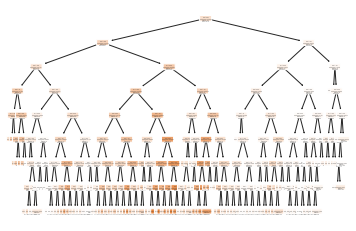

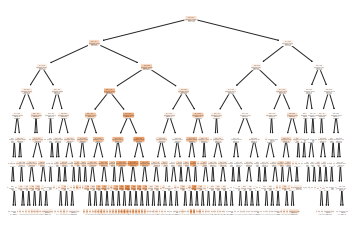

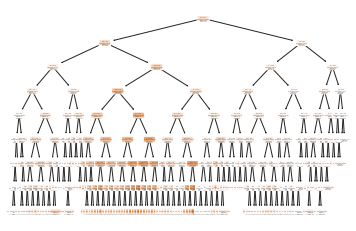

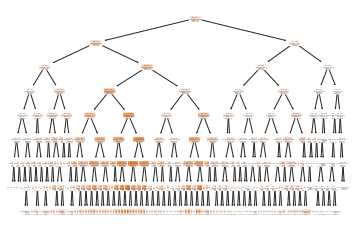

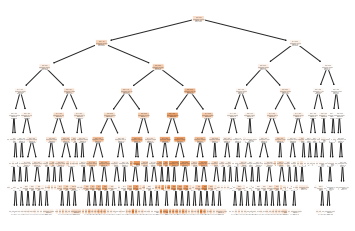

...

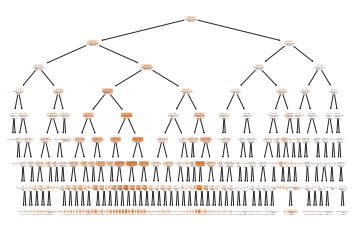

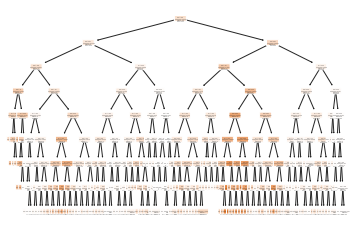

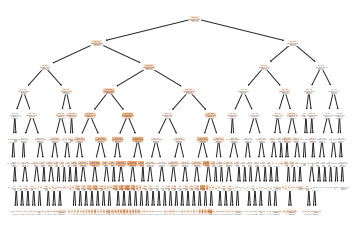

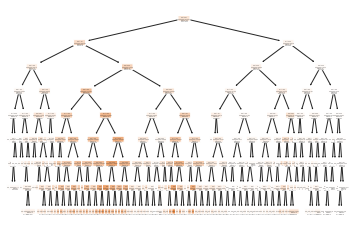

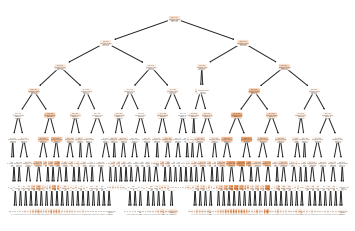

[CV] END bootstrap=True, max_depth=6, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=1000; total time=   1.5s
[CV] END bootstrap=True, max_depth=6, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=200; total time=   0.3s
[CV] END bootstrap=True, max_depth=6, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=1000; total time=   2.6s
[CV] END bootstrap=True, max_depth=6, max_features=5, min_samples_leaf=5, min_samples_split=8, n_estimators=200; total time=   0.5s
[CV] END bootstrap=True, max_depth=6, max_features=5, min_samples_leaf=5, min_samples_split=8, n_estimators=1000; total time=   1.9s
[CV] END bootstrap=True, max_depth=7, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=200; total time=   0.3s
[CV] END bootstrap=True, max_depth=7, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=1000; total time=   1.3s
[CV] END bootstrap=True, max_depth=7, max_features=2, min_samples_leaf=4

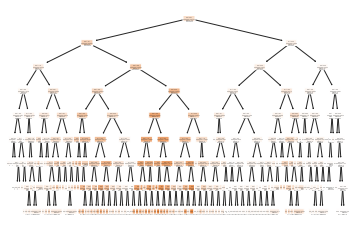

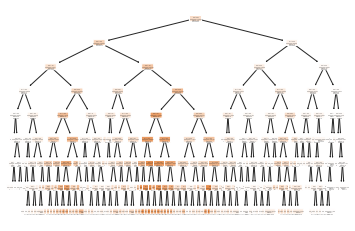

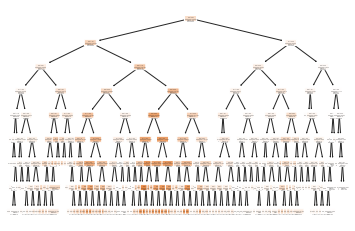

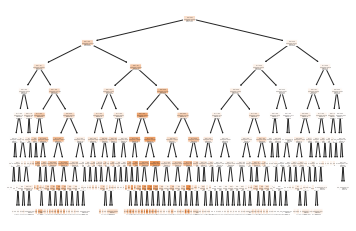

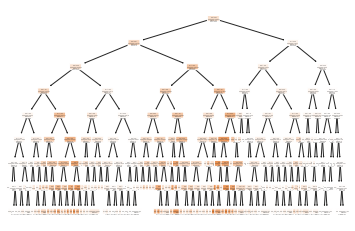

...

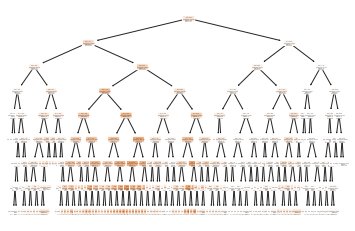

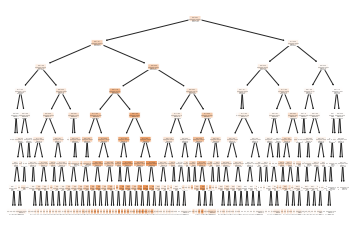

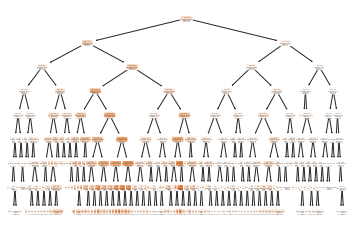

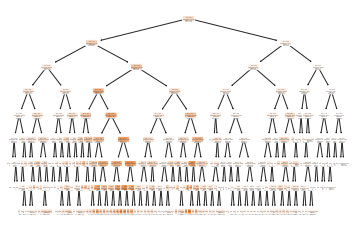

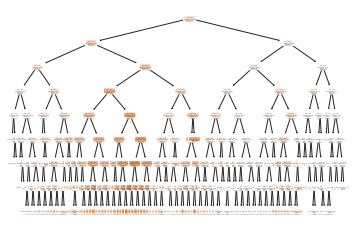

KeyboardInterrupt: 

In [ ]:
from sklearn import tree
for x in range(len(grid_search.best_estimator_.estimators_)):
    tree.plot_tree(
    grid_search.best_estimator_.estimators_[x], # Access each individual estimator
    filled=True,
    rounded=True,
    )
    plt.show()